In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import os
%matplotlib inline
from tensorflow.python.client import device_lib
from tensorflow.keras.models import Sequential, load_model, clone_model
import tensorflow_hub as hub
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Input, Dropout, MaxPool2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy, SparseCategoricalCrossentropy, CategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard, ModelCheckpoint
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers
device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 6147591765784846252,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 2254123828
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 11923316423997060763
 physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1650 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"]

# 5. Transfer Learning

## 5.1 Feature Extraction

In [2]:
len(os.listdir('10_food_classes_10_percent/10_food_classes_10_percent/train/chicken_curry/'))

75

In [3]:
len(os.listdir('10_food_classes_10_percent/10_food_classes_10_percent/test/chicken_curry/'))

250

In [4]:
len(os.listdir('10_food_classes_10_percent/10_food_classes_10_percent/train/'))

10

In [5]:
# Create train test dir
train_dir = '10_food_classes_10_percent/10_food_classes_10_percent/train/'
test_dir = '10_food_classes_10_percent/10_food_classes_10_percent/test/'

# Create image data generator(augmented)
non_augmented = ImageDataGenerator(rescale=1/255)

# Create train test data
print('Train data:')
train_data = non_augmented.flow_from_directory(directory=train_dir,
                                           target_size=(224, 224),
                                           seed=42)
print('Test data:')
test_data = non_augmented.flow_from_directory(directory=test_dir,
                                              target_size=(224, 224),
                                              seed=42)

Train data:
Found 750 images belonging to 10 classes.
Test data:
Found 2500 images belonging to 10 classes.


In [46]:
train_data

In [6]:
train_data[0][0].shape # Batch, Width, Height, Color Channel

(32, 224, 224, 3)

In [130]:
def view_images(img_data):
    img, labels = img_data.next()
    plt.figure(figsize=(12, 12))
    
    for i in range(16):
        name = 0
        random_index = np.random.choice(len(img))
        for label, key in img_data.class_indices.items():
            if np.argmax(labels[random_index]) == key:
                name = label
        
        plt.subplot(4, 4, i+1)
        plt.imshow(img[random_index])
        plt.title(name)
        plt.axis('off')

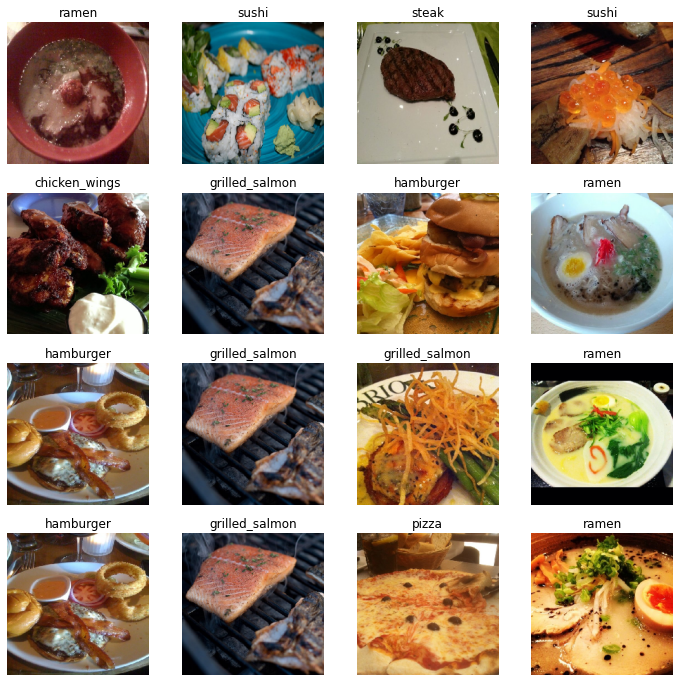

In [8]:
view_images(train_data)

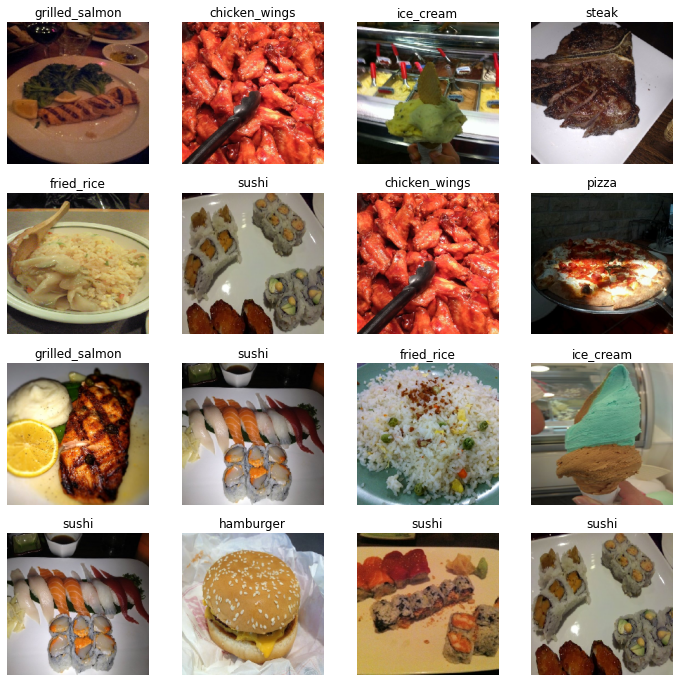

In [9]:
view_images(test_data)

## 5.2 Setting up callbacks

Callbacks are extra functionality you can add to your models to be performed during or after training. **Some of the most popular callbacks:**

* Tracking experiements with Tersorboard callback
* Model checkpoint with ModelCheckpoint callback
* Stopping a model from training before overfitting with EarlyStopping callback


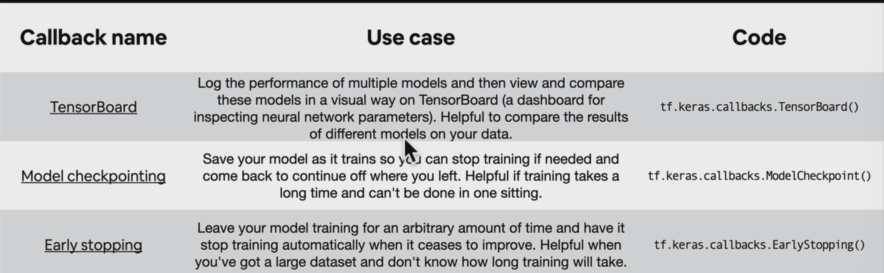

In [11]:
# Create Tensorboard callback
import datetime

def create_tensorboard_callbacks(dir_name, experiment_name):
    log_dir = dir_name + '/' + experiment_name + '/' + datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
    tensorboard_callback = TensorBoard(log_dir=log_dir)
    print(f'Saving Tensorboard log files to: {log_dir}')
    return tensorboard_callback

## 5.3 Creating model from Tensorflow Hub

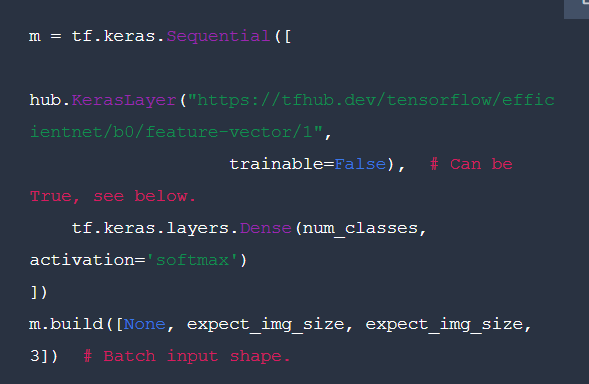

In [12]:
efficient_link = 'https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1'
resnet_link = 'https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/1'

In [21]:
# Set a random seed
tf.random.set_seed(42)

# Create a model
model_efficient = Sequential()
model_efficient.add(Input(shape=(224, 224, 3)))
model_efficient.add(hub.KerasLayer(efficient_link))
model_efficient.add(Dense(10, activation='sigmoid'))
model_efficient.build([32, 224, 224, 3])

# Compile a model
model_efficient.compile(loss=CategoricalCrossentropy(),
                        optimizer=Adam(),
                        metrics='acc')

# Fit a model
efficient_history = model_efficient.fit(train_data,
                                        steps_per_epoch=len(train_data),
                                        validation_data=test_data,
                                        validation_steps=len(test_data),
                                        epochs=10,
                                        callbacks=create_tensorboard_callbacks(dir_name='Tensorflow_hub',
                                                                              experiment_name='EfficientNetB0'))

model_efficient.save('tensorflow_hub/model_food_10%/efficient_net_model.h5')

Saving Tensorboard log files to: Tensorflow_hub/EfficientNetB0/20211013-145706
Epoch 1/10
24/24 [==============================] - 22s 627ms/step - loss: 1.8362 - acc: 0.4360 - val_loss: 1.2802 - val_acc: 0.7256
Epoch 2/10
24/24 [==============================] - 10s 408ms/step - loss: 1.0557 - acc: 0.7680 - val_loss: 0.8548 - val_acc: 0.8264
Epoch 3/10
24/24 [==============================] - 10s 416ms/step - loss: 0.7531 - acc: 0.8387 - val_loss: 0.6879 - val_acc: 0.8492
Epoch 4/10
24/24 [==============================] - 10s 416ms/step - loss: 0.6054 - acc: 0.8720 - val_loss: 0.6027 - val_acc: 0.8576
Epoch 5/10
24/24 [==============================] - 10s 412ms/step - loss: 0.5128 - acc: 0.8920 - val_loss: 0.5507 - val_acc: 0.8664
Epoch 6/10
24/24 [==============================] - 10s 406ms/step - loss: 0.4427 - acc: 0.9173 - val_loss: 0.5140 - val_acc: 0.8744
Epoch 7/10
24/24 [==============================] - 9s 403ms/step - loss: 0.3884 - acc: 0.9307 - val_loss: 0.4906 - val_acc

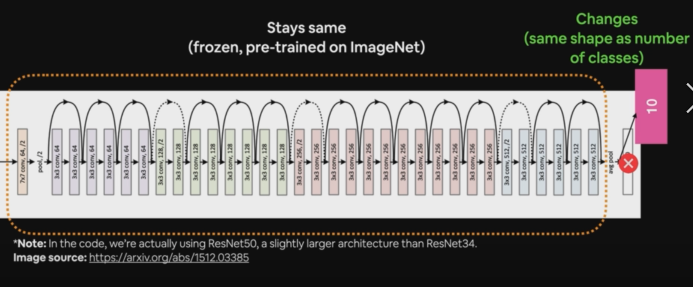

In [13]:
# Let's make a create_model() function to create a model from URL
def create_model(model_url, num_classes=10):
    """
    Takes a Tensorflow Hub URL and create a Keras Sequential model with it
    
    Args:
        model_url (str): A Tensorflow Hub feature extraction URL
        num_classes (int): Number of output neurons in the output
        layer.
        
    Returns:
        An uncompiled Keras Sequental model with model_url as
        feature extractor layer and Dense output layer 
        with num_classes output neurons.
    """
    # Download the pretrained model and save it as keras layer
    feature_extractor_layer = hub.KerasLayer(model_url,
                                             trainable=False,
                                             name='feature_extraction_layer',
                                             input_shape=(224, 224, 3)) # Freeze the already learned patterns
    
    # Create a model
    model = Sequential()
    model.add(feature_extractor_layer)
    model.add(Dense(num_classes, activation='softmax', name='ouput_layer'))
    
    # Return model
    return model

In [14]:
train_data.num_classes

10

In [15]:
# Create resnet model
resnet_model = create_model(resnet_link, num_classes=train_data.num_classes)

In [16]:
resnet_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
feature_extraction_layer (Ke (None, 2048)              23564800  
_________________________________________________________________
ouput_layer (Dense)          (None, 10)                20490     
Total params: 23,585,290
Trainable params: 20,490
Non-trainable params: 23,564,800
_________________________________________________________________


In [17]:
# Compile our resnet model
resnet_model.compile(loss=CategoricalCrossentropy(),
                     optimizer=Adam(),
                     metrics='acc')

# Fit our model
resnet_history = resnet_model.fit(train_data, 
                                  steps_per_epoch=len(train_data),
                                  validation_data=test_data,
                                  validation_steps=len(test_data),
                                  epochs=10,
                                  callbacks=create_tensorboard_callbacks(dir_name='Tensorflow_hub',
                                                                              experiment_name='ResnetV250'))

resnet_model.save('tensorflow_hub/model_food_10%/resnet_model.h5')

Saving Tensorboard log files to: Tensorflow_hub/ResnetV250/20211013-145254
Epoch 1/10
24/24 [==============================] - 30s 826ms/step - loss: 1.9898 - acc: 0.3493 - val_loss: 1.2539 - val_acc: 0.6040
Epoch 2/10
24/24 [==============================] - 15s 654ms/step - loss: 0.9361 - acc: 0.7307 - val_loss: 0.9036 - val_acc: 0.7052
Epoch 3/10
24/24 [==============================] - 15s 661ms/step - loss: 0.6369 - acc: 0.8227 - val_loss: 0.7685 - val_acc: 0.7496
Epoch 4/10
24/24 [==============================] - 15s 661ms/step - loss: 0.4792 - acc: 0.8813 - val_loss: 0.7222 - val_acc: 0.7680
Epoch 5/10
24/24 [==============================] - 15s 660ms/step - loss: 0.3825 - acc: 0.9227 - val_loss: 0.6994 - val_acc: 0.7668
Epoch 6/10
24/24 [==============================] - 15s 659ms/step - loss: 0.3132 - acc: 0.9373 - val_loss: 0.6871 - val_acc: 0.7692
Epoch 7/10
24/24 [==============================] - 15s 659ms/step - loss: 0.2611 - acc: 0.9573 - val_loss: 0.6728 - val_acc: 0

In [18]:
resnet_history_df = pd.DataFrame(resnet_history.history)
resnet_history_df.head()

,loss,acc,val_loss,val_acc
0,1.989759,0.349333,1.253864,0.6040
1,0.936061,0.730667,0.903625,0.7052
2,0.636875,0.822667,0.768498,0.7496
3,0.479196,0.881333,0.722233,0.7680
4,0.382500,0.922667,0.699380,0.7668


In [19]:
resnet_history_df[['acc', 'val_acc']]

,acc,val_acc
0,0.349333,0.6040
1,0.730667,0.7052
2,0.822667,0.7496
3,0.881333,0.7680
4,0.922667,0.7668
5,0.937333,0.7692
6,0.957333,0.7800
7,0.968000,0.7836
8,0.977333,0.7816
9,0.980000,0.7860


In [22]:
efficient_history_df = pd.DataFrame(efficient_history.history)
efficient_history_df.head()

,loss,acc,val_loss,val_acc
0,1.836245,0.436000,1.280185,0.7256
1,1.055743,0.768000,0.854773,0.8264
2,0.753078,0.838667,0.687941,0.8492
3,0.605445,0.872000,0.602707,0.8576
4,0.512790,0.892000,0.550699,0.8664


In [23]:
# Set a random seed
tf.random.set_seed(42)

# Mobile model
mobile_link = 'https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5'

# Create a model
mobile_model = Sequential()
mobile_model.add(Input(shape=(224, 224, 3)))
mobile_model.add(hub.KerasLayer(mobile_link))
mobile_model.add(Dense(10, activation='sigmoid'))
mobile_model.build([32, 224, 224, 3])

# Compile a model
mobile_model.compile(loss=CategoricalCrossentropy(),
                        optimizer=Adam(),
                        metrics='acc')

# Fit a model
mobile_history = mobile_model.fit(train_data,
                                  steps_per_epoch=len(train_data),
                                  validation_data=test_data,
                                  validation_steps=len(test_data),
                                  epochs=10,
                                  callbacks=create_tensorboard_callbacks(dir_name='Tensorflow_hub',
                                                                              experiment_name='MobileNet'))

mobile_model.save('tensorflow_hub/model_food_10%/mobile_net_model.h5')

Saving Tensorboard log files to: Tensorflow_hub/MobileNet/20211013-150825
Epoch 1/10
24/24 [==============================] - 18s 503ms/step - loss: 2.2009 - acc: 0.2947 - val_loss: 1.2129 - val_acc: 0.6164
Epoch 2/10
24/24 [==============================] - 8s 361ms/step - loss: 0.8901 - acc: 0.7347 - val_loss: 0.7424 - val_acc: 0.7608
Epoch 3/10
24/24 [==============================] - 8s 361ms/step - loss: 0.5772 - acc: 0.8240 - val_loss: 0.6242 - val_acc: 0.8040
Epoch 4/10
24/24 [==============================] - 8s 355ms/step - loss: 0.4295 - acc: 0.8813 - val_loss: 0.5771 - val_acc: 0.8140
Epoch 5/10
24/24 [==============================] - 8s 355ms/step - loss: 0.3336 - acc: 0.9213 - val_loss: 0.5550 - val_acc: 0.8172
Epoch 6/10
24/24 [==============================] - 8s 349ms/step - loss: 0.2624 - acc: 0.9573 - val_loss: 0.5301 - val_acc: 0.8292
Epoch 7/10
24/24 [==============================] - 8s 346ms/step - loss: 0.2227 - acc: 0.9640 - val_loss: 0.5300 - val_acc: 0.8228
E

In [24]:
mobile_history_df = pd.DataFrame(mobile_history.history)
mobile_history_df.head()

,loss,acc,val_loss,val_acc
0,2.200895,0.294667,1.212854,0.6164
1,0.890123,0.734667,0.742424,0.7608
2,0.577156,0.824000,0.624219,0.8040
3,0.429531,0.881333,0.577140,0.8140
4,0.333554,0.921333,0.555012,0.8172


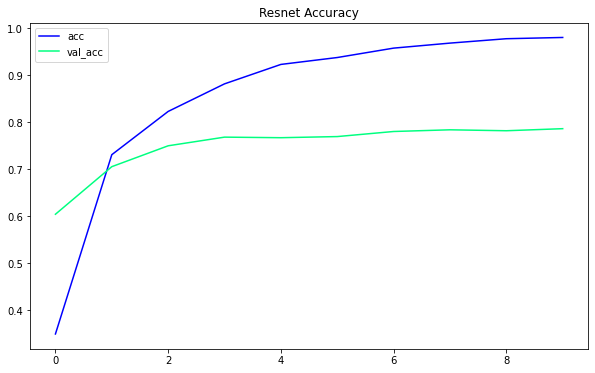

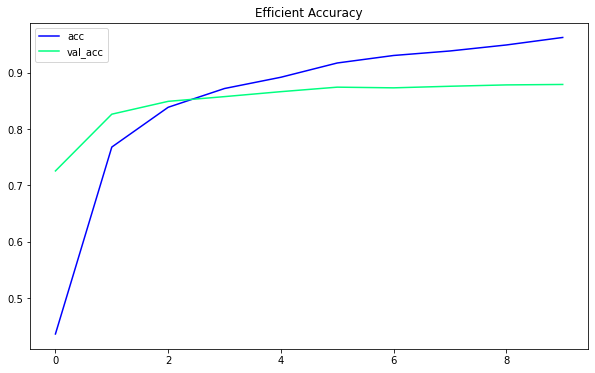

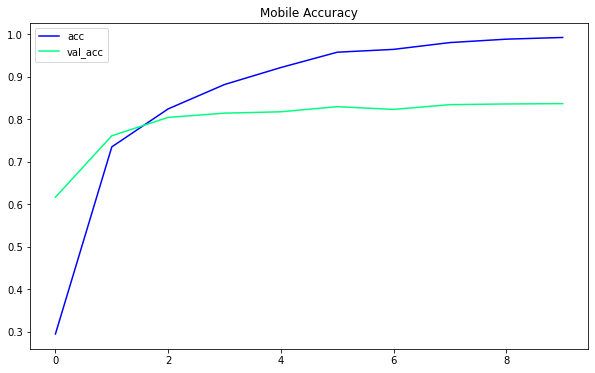

In [25]:
resnet_history_df[['acc','val_acc']].plot(figsize=(10, 6), title='Resnet Accuracy', cmap='winter');
efficient_history_df[['acc','val_acc']].plot(figsize=(10, 6), title='Efficient Accuracy', cmap='winter');
mobile_history_df[['acc','val_acc']].plot(figsize=(10, 6), title='Mobile Accuracy', cmap='winter');

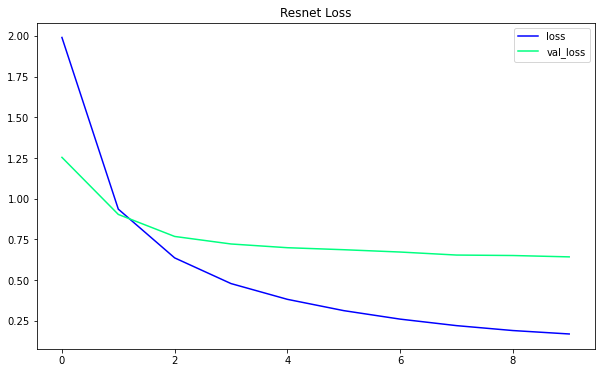

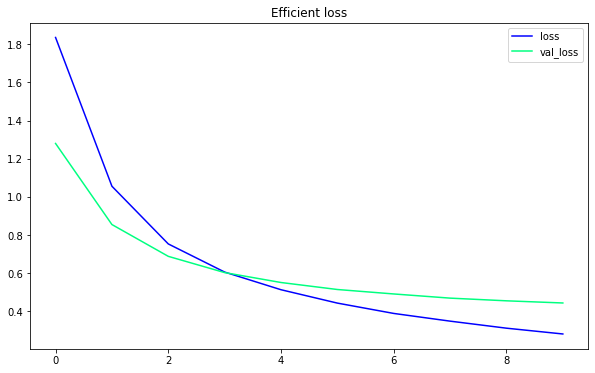

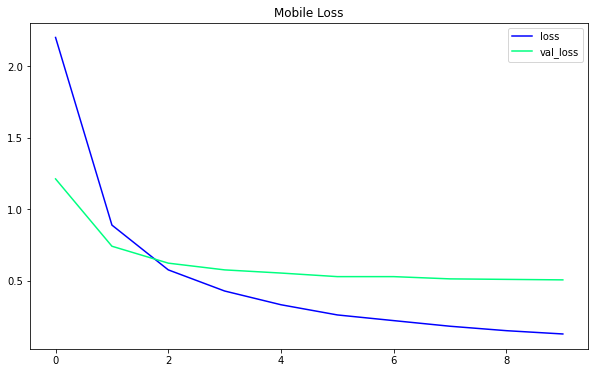

In [26]:
resnet_history_df[['loss','val_loss']].plot(figsize=(10, 6), title='Resnet Loss', cmap='winter');
efficient_history_df[['loss','val_loss']].plot(figsize=(10, 6), title='Efficient loss', cmap='winter');
mobile_history_df[['loss','val_loss']].plot(figsize=(10, 6), title='Mobile Loss', cmap='winter');

In [27]:
model_efficient.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1280)              4049564   
_________________________________________________________________
dense (Dense)                (None, 10)                12810     
Total params: 4,062,374
Trainable params: 12,810
Non-trainable params: 4,049,564
_________________________________________________________________


In [28]:
resnet_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
feature_extraction_layer (Ke (None, 2048)              23564800  
_________________________________________________________________
ouput_layer (Dense)          (None, 10)                20490     
Total params: 23,585,290
Trainable params: 20,490
Non-trainable params: 23,564,800
_________________________________________________________________


In [29]:
mobile_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer_1 (KerasLayer)   (None, 1001)              5508713   
_________________________________________________________________
dense_1 (Dense)              (None, 10)                10020     
Total params: 5,518,733
Trainable params: 10,020
Non-trainable params: 5,508,713
_________________________________________________________________


## 5.4 Different types of transfer learning

* **`As is` transfer learning** - using the existing model with no changes what so ever (e.g using ImageNet model on 1000 ImageNet classes, none of your own)
* **`Feature extraction` transfer learning** - use the prelearned patterns of an existing model (e.g EfficientNetB0 trained on ImageNet) and adjust the output layer for your own problem (e.g 1000 classes -> 10 classes of food)
* **`Fine-tuning` transfer learning** - use the prelearned patterns of an existing model and 'fine-tune' many or all of the underlying layers (including new output layers)

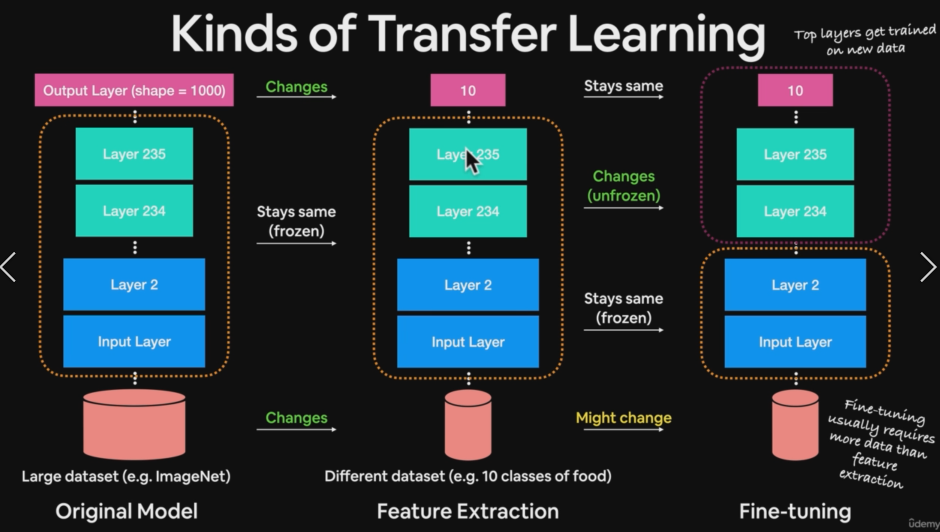

In [30]:
len(model_efficient.layers[0].weights) # Check how many layers (approximation)

309

## 5.5 Comparing our model results using TensorBoard

> **🔑Note:** When you upload things to Tensorboard.dev, your experiments are public

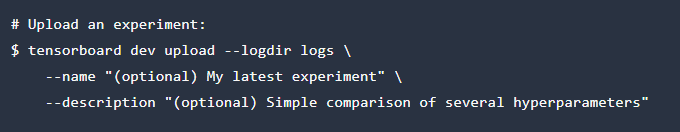

>**See tensorboard experiment list:**
tensorboard dev list

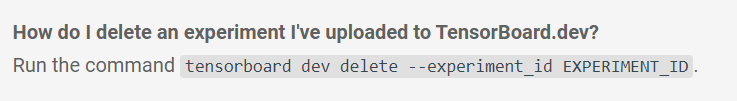

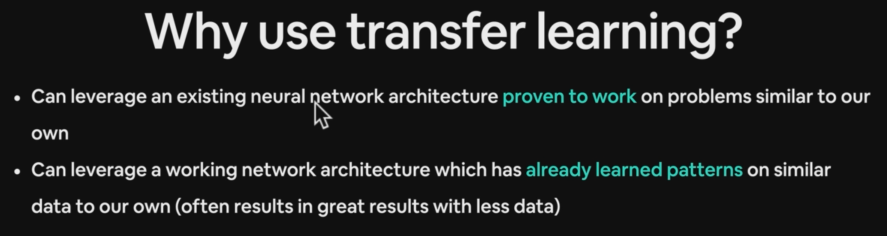

## 5.6 Fine Tuning

This time we're going to see how we can use the pretrained model within `tf.keras.application` and apply them to our own problem.

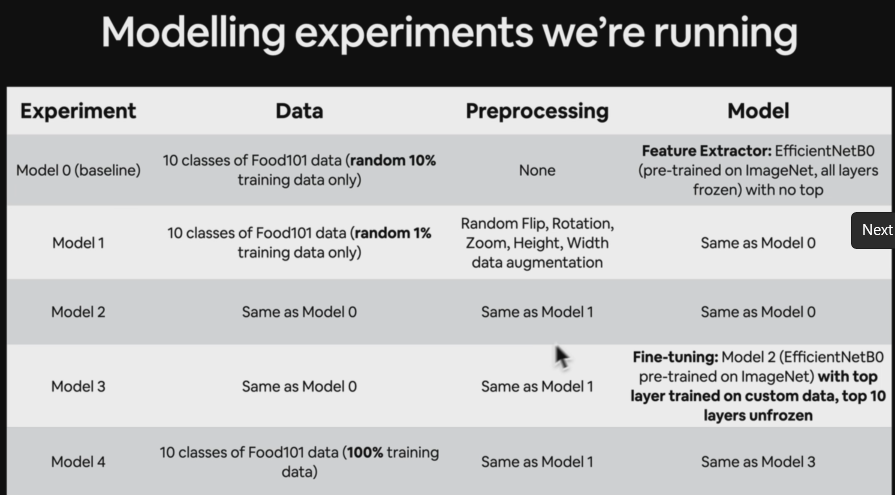

In [2]:
import helper_functions as helper

In [132]:
# Create a train and test directory
train_dir_10_percent = '10_food_classes_10_percent/10_food_classes_10_percent/train/'
test_dir_10_percent = '10_food_classes_10_percent/10_food_classes_10_percent/test/'

# Create train test data with image dataset from directory
train_data = image_dataset_from_directory(directory=train_dir_10_percent,
                                          label_mode='categorical',
                                          image_size=(224, 224),
                                          seed=42)

test_data = image_dataset_from_directory(directory=test_dir_10_percent, 
                                         label_mode='categorical',
                                         image_size=(224, 224),
                                         seed=42)

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [133]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 10)), types: (tf.float32, tf.float32)>

In [134]:
len(train_data), len(test_data) # How many batches

(24, 79)

In [135]:
for images, labels in train_data.take(1):
    print(images[0], labels[0])

tf.Tensor(
[[[1.10000000e+02 6.32397957e+01 0.00000000e+00]
  [1.18780609e+02 7.49744949e+01 7.37755108e+00]
  [1.06168365e+02 6.54438782e+01 1.02551079e+00]
  ...
  [9.51429443e+01 5.70000000e+01 2.21426392e+00]
  [1.04714348e+02 6.15000267e+01 8.57146740e+00]
  [1.10357109e+02 6.33571091e+01 9.35710812e+00]]

 [[1.14693878e+02 7.08877563e+01 4.36224604e+00]
  [1.14423470e+02 7.30051041e+01 7.14285660e+00]
  [1.10346939e+02 7.12346954e+01 6.29081631e+00]
  ...
  [9.44694366e+01 5.59285736e+01 1.34179497e+00]
  [1.00285751e+02 5.70714264e+01 4.14286995e+00]
  [1.07311264e+02 5.74490089e+01 4.40309334e+00]]

 [[1.07239792e+02 6.82346954e+01 7.65306503e-02]
  [1.13382652e+02 7.48112259e+01 7.59694004e+00]
  [1.13469383e+02 7.48520432e+01 9.94387722e+00]
  ...
  [9.81888351e+01 5.96173630e+01 5.04589176e+00]
  [1.02857155e+02 5.68571548e+01 4.85715580e+00]
  [1.09576607e+02 5.95766068e+01 6.57660770e+00]]

 ...

 [[9.08060455e+01 6.93775177e+01 2.37751961e+00]
  [9.02449646e+01 6.91990509

## 5.7 Sequential API vs Functional API

>The sequential API is straight-forward, it runs our layers in sequential order.
But the functional API gives us more flexibility with our models.

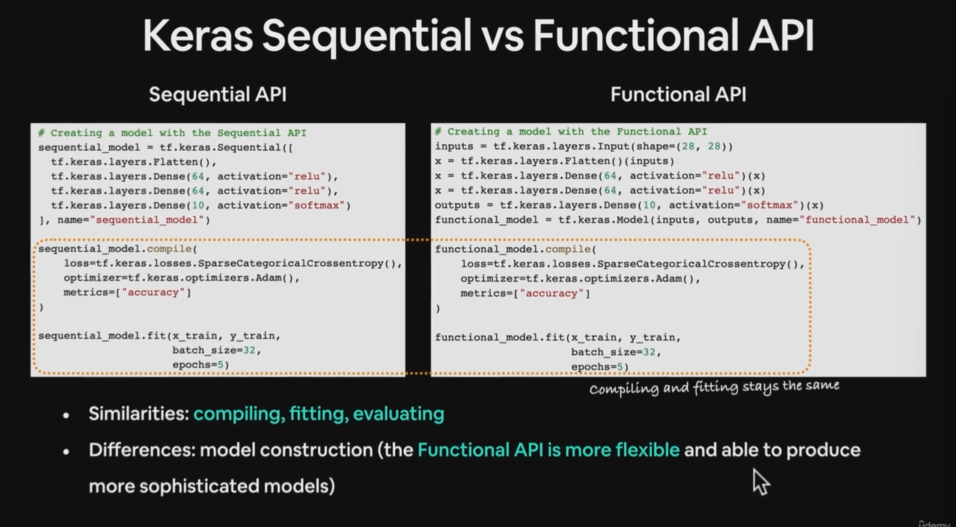

In [136]:
# 0. Set random seed
tf.random.set_seed(42)

# 1. Create a baseline model with tf.keras.application and with functional API (feature extraction)
base_model = EfficientNetB0(include_top=False)

# 2. Freeze the base model (so the underlying pre-trained pattern aren't updated)
base_model.trainable = False

# 3. Create inputs into our model
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name='input_layer')

# 4. If you using ResNet50V2 you will need to normalize inputs
# x = tf.keras.layers.experimental.preprocessing.Rescaling(1/255)(inputs)

# 5. Pass the inputs to base model
x = base_model(inputs)
print(f'Shape after passsing input through base model: {x.shape}')

# 6. Average pool the outputs of the base model (aggregate all the most important information)
x = tf.keras.layers.GlobalAveragePooling2D(name='global_average_pooling_layer')(x)
print(f'Shape after GlobalAveragePooling2D: {x.shape}')

# 7. Create the output activation layer
outputs = tf.keras.layers.Dense(10, activation='softmax', name='output_layer')(x)

# 8. Combine the input with the outputs into a model
model_0 = tf.keras.Model(inputs, outputs)

# 9. Compile a model
model_0.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics='accuracy')

# 10. Fit a model
model_0_history = model_0.fit(train_data,
                  steps_per_epoch=len(train_data),
                  validation_data=test_data,
                  validation_steps=len(test_data),
                  epochs=10,
                  callbacks=TensorBoard(log_dir='transfer_learning/model_0_10_percent/3rd_model'))

# 11. Save our model
model_0.save('transfer_learning/model_0_10_percent_3rd')

Shape after passsing input through base model: (None, 7, 7, 1280)
Shape after GlobalAveragePooling2D: (None, 1280)
ERROR:tensorflow:Failed to start profiler: Another profiler is running.
Epoch 1/10


C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


24/24 [==============================] - 17s 561ms/step - loss: 1.9867 - accuracy: 0.3040 - val_loss: 1.4229 - val_accuracy: 0.6376
Epoch 2/10
24/24 [==============================] - 10s 419ms/step - loss: 1.1946 - accuracy: 0.7240 - val_loss: 0.9653 - val_accuracy: 0.7772
Epoch 3/10
24/24 [==============================] - 10s 417ms/step - loss: 0.8621 - accuracy: 0.8067 - val_loss: 0.7735 - val_accuracy: 0.8176
Epoch 4/10
24/24 [==============================] - 10s 417ms/step - loss: 0.7054 - accuracy: 0.8320 - val_loss: 0.6765 - val_accuracy: 0.8336
Epoch 5/10
24/24 [==============================] - 10s 417ms/step - loss: 0.5995 - accuracy: 0.8613 - val_loss: 0.6182 - val_accuracy: 0.8388
Epoch 6/10
24/24 [==============================] - 10s 420ms/step - loss: 0.5212 - accuracy: 0.8893 - val_loss: 0.5786 - val_accuracy: 0.8436
Epoch 7/10
24/24 [==============================] - 10s 418ms/step - loss: 0.4660 - accuracy: 0.8987 - val_loss: 0.5491 - val_accuracy: 0.8492
Epoch 8/10

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


In [137]:
model_0.summary()

Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
global_average_pooling_layer (None, 1280)              0         
_________________________________________________________________
output_layer (Dense)         (None, 10)                12810     
Total params: 4,062,381
Trainable params: 12,810
Non-trainable params: 4,049,571
_________________________________________________________________


In [15]:
model_0_3nd = load_model('transfer_learning/model_0_10_percent_3rd/')

In [16]:
model_0_3nd.evaluate(test_data) # If you want to save your model when using Functional API, use SavedModel format instead of .h5

79/79 [==============================] - 13s 124ms/step - loss: 0.4971 - accuracy: 0.8524


[0.4971444308757782, 0.852400004863739]

In [10]:
model_0_2nd = load_model('transfer_learning/model_0_10_percent_2nd.h5')

In [11]:
model_0_2nd.evaluate(test_data)

79/79 [==============================] - 12s 116ms/step - loss: 0.7711 - accuracy: 0.7456


[0.7710615992546082, 0.7455999851226807]

In [12]:
model_0.evaluate(test_data)

79/79 [==============================] - 9s 115ms/step - loss: 0.4996 - accuracy: 0.8548


[0.4996427297592163, 0.8547999858856201]

In [64]:
for layer_number, layer in enumerate(base_model.layers):
    print(layer_number, layer.name)

0 input_5
1 rescaling_2
2 normalization_2
3 stem_conv_pad
4 stem_conv
5 stem_bn
6 stem_activation
7 block1a_dwconv
8 block1a_bn
9 block1a_activation
10 block1a_se_squeeze
11 block1a_se_reshape
12 block1a_se_reduce
13 block1a_se_expand
14 block1a_se_excite
15 block1a_project_conv
16 block1a_project_bn
17 block2a_expand_conv
18 block2a_expand_bn
19 block2a_expand_activation
20 block2a_dwconv_pad
21 block2a_dwconv
22 block2a_bn
23 block2a_activation
24 block2a_se_squeeze
25 block2a_se_reshape
26 block2a_se_reduce
27 block2a_se_expand
28 block2a_se_excite
29 block2a_project_conv
30 block2a_project_bn
31 block2b_expand_conv
32 block2b_expand_bn
33 block2b_expand_activation
34 block2b_dwconv
35 block2b_bn
36 block2b_activation
37 block2b_se_squeeze
38 block2b_se_reshape
39 block2b_se_reduce
40 block2b_se_expand
41 block2b_se_excite
42 block2b_project_conv
43 block2b_project_bn
44 block2b_drop
45 block2b_add
46 block3a_expand_conv
47 block3a_expand_bn
48 block3a_expand_activation
49 block3a_d

In [66]:
base_model.summary()

Model: "efficientnetb0"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
rescaling_2 (Rescaling)         (None, None, None, 3 0           input_5[0][0]                    
__________________________________________________________________________________________________
normalization_2 (Normalization) (None, None, None, 3 7           rescaling_2[0][0]                
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, None, None, 3 0           normalization_2[0][0]            
_____________________________________________________________________________________

In [67]:
model_0.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
global_average_pooling_layer (None, 1280)              0         
_________________________________________________________________
output_layer (Dense)         (None, 10)                12810     
Total params: 4,062,381
Trainable params: 12,810
Non-trainable params: 4,049,571
_________________________________________________________________


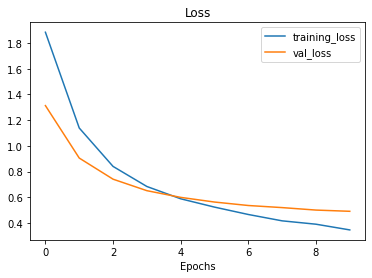

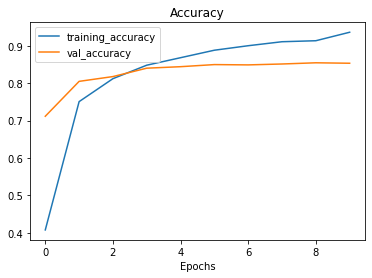

In [74]:
plot_loss_curves(model_0_history)

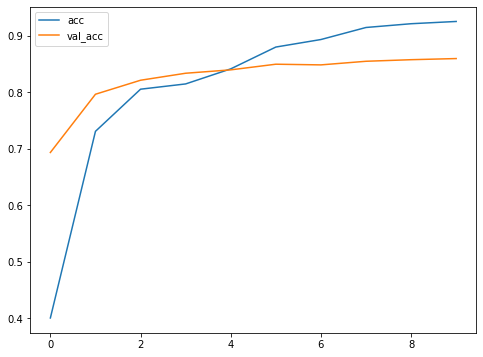

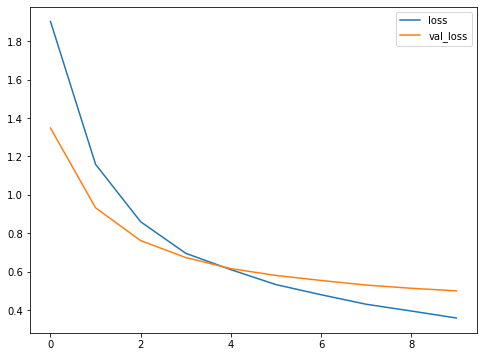

In [71]:
model_0_history_df = pd.DataFrame(model_0_history.history)
model_0_history_df[['acc', 'val_acc']].plot(figsize=(8,6))
model_0_history_df[['loss', 'val_loss']].plot(figsize=(8,6));

## 5.8 Getting feature vectors from trained model

Let's demonstrate the Global Average Pooling 2D layer..

We have a tensor after our model goes through `base_model` of shape
(None, 7, 7 1280)

But when it passes through GlobalAveragePooling2D, it turns into (None, 1280)

Let's use similar shaped tensor of (1, 4, 4, 3) and then pass it to GlobalAveragePooling2D.

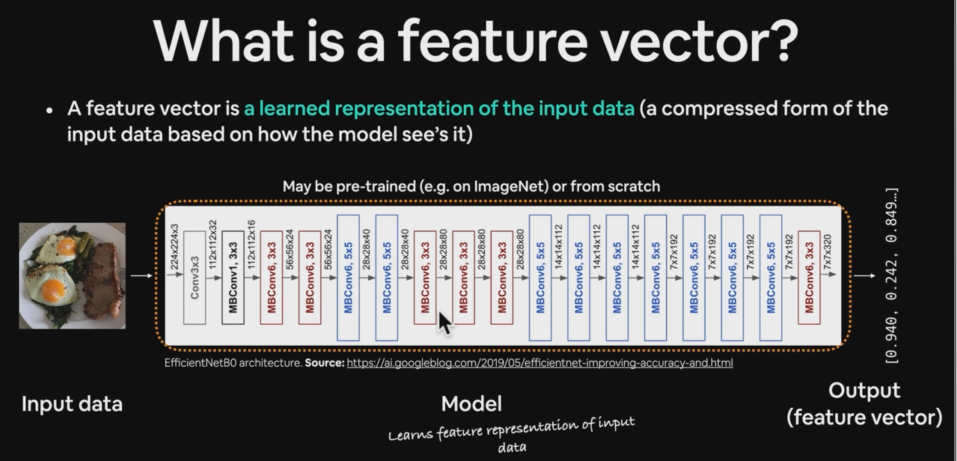

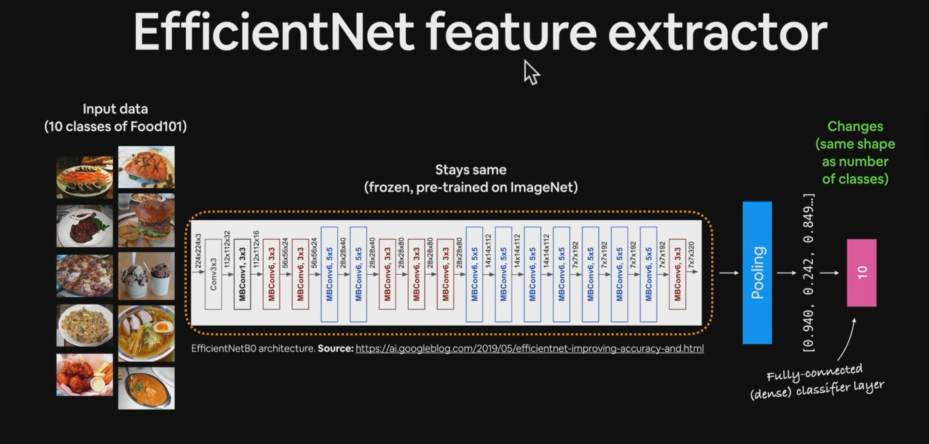

In [43]:
# Create random tensor
tf.random.set_seed(42)
tensor = tf.random.normal(shape=(1, 4, 4, 3))
print(f'Random input tensor: \n{tensor}\n Shape: {tensor.shape}\n')

# Pass the random tensor through a global average pooling 2D layer
global_avg_pooled_2d = tf.keras.layers.GlobalAveragePooling2D()(tensor)
print(f'2D global average pooled tensor:\n {global_avg_pooled_2d}\n Shape:{global_avg_pooled_2d.shape}\n')

Random input tensor: 
[[[[ 0.3274685  -0.8426258   0.3194337 ]
   [-1.4075519  -2.3880599  -1.0392479 ]
   [-0.5573232   0.539707    1.6994323 ]
   [ 0.28893656 -1.5066116  -0.2645474 ]]

  [[-0.59722406 -1.9171132  -0.62044144]
   [ 0.8504023  -0.40604794 -3.0258412 ]
   [ 0.9058464   0.29855987 -0.22561555]
   [-0.7616443  -1.8917141  -0.93847126]]

  [[ 0.77852213 -0.47338897  0.97772694]
   [ 0.24694404  0.20573747 -0.5256233 ]
   [ 0.32410017  0.02545409 -0.10638497]
   [-0.6369475   1.1603122   0.2507359 ]]

  [[-0.41728503  0.4012578  -1.4145443 ]
   [-0.5931857  -1.6617213   0.33567193]
   [ 0.10815629  0.23479682 -0.56668764]
   [-0.35819843  0.88698614  0.52744764]]]]
 Shape: (1, 4, 4, 3)

2D global average pooled tensor:
 [[-0.09368646 -0.45840448 -0.2885598 ]]
 Shape:(1, 3)



In [49]:
tensor[:, :, :, 0]

<tf.Tensor: shape=(1, 4, 4), dtype=float32, numpy=
array([[[ 0.3274685 , -1.4075519 , -0.5573232 ,  0.28893656],
        [-0.59722406,  0.8504023 ,  0.9058464 , -0.7616443 ],
        [ 0.77852213,  0.24694404,  0.32410017, -0.6369475 ],
        [-0.41728503, -0.5931857 ,  0.10815629, -0.35819843]]],
      dtype=float32)>

In [52]:
np.mean(tensor[:, :, :, 0])

-0.093686484

In [53]:
tensor[:, :, :, 1]

<tf.Tensor: shape=(1, 4, 4), dtype=float32, numpy=
array([[[-0.8426258 , -2.3880599 ,  0.539707  , -1.5066116 ],
        [-1.9171132 , -0.40604794,  0.29855987, -1.8917141 ],
        [-0.47338897,  0.20573747,  0.02545409,  1.1603122 ],
        [ 0.4012578 , -1.6617213 ,  0.23479682,  0.88698614]]],
      dtype=float32)>

In [54]:
np.mean(tensor[:, :, :, 1])

-0.45840448

In [55]:
tensor[:, :, :, 2]

<tf.Tensor: shape=(1, 4, 4), dtype=float32, numpy=
array([[[ 0.3194337 , -1.0392479 ,  1.6994323 , -0.2645474 ],
        [-0.62044144, -3.0258412 , -0.22561555, -0.93847126],
        [ 0.97772694, -0.5256233 , -0.10638497,  0.2507359 ],
        [-1.4145443 ,  0.33567193, -0.56668764,  0.52744764]]],
      dtype=float32)>

In [56]:
np.mean(tensor[:, :, :, 2])

-0.28855976

In [58]:
tf.math.reduce_mean(tensor, axis=[1, 2]) # Axis where it want to be condensed (same format with global avg pooled tensor shape)

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[-0.09368646, -0.45840448, -0.2885598 ]], dtype=float32)>

In [60]:
# Create random tensor
tf.random.set_seed(42)
tensor = tf.random.normal(shape=(1, 4, 4, 3))
print(f'Random input tensor: \n{tensor}\n Shape: {tensor.shape}\n')

# Create global max pooling layer
global_max_pooled_tensor = tf.keras.layers.GlobalMaxPooling2D()(tensor)
print(f'2D global average pooled tensor:\n {global_max_pooled_tensor}\n Shape:{global_max_pooled_tensor.shape}\n')

Random input tensor: 
[[[[ 0.3274685  -0.8426258   0.3194337 ]
   [-1.4075519  -2.3880599  -1.0392479 ]
   [-0.5573232   0.539707    1.6994323 ]
   [ 0.28893656 -1.5066116  -0.2645474 ]]

  [[-0.59722406 -1.9171132  -0.62044144]
   [ 0.8504023  -0.40604794 -3.0258412 ]
   [ 0.9058464   0.29855987 -0.22561555]
   [-0.7616443  -1.8917141  -0.93847126]]

  [[ 0.77852213 -0.47338897  0.97772694]
   [ 0.24694404  0.20573747 -0.5256233 ]
   [ 0.32410017  0.02545409 -0.10638497]
   [-0.6369475   1.1603122   0.2507359 ]]

  [[-0.41728503  0.4012578  -1.4145443 ]
   [-0.5931857  -1.6617213   0.33567193]
   [ 0.10815629  0.23479682 -0.56668764]
   [-0.35819843  0.88698614  0.52744764]]]]
 Shape: (1, 4, 4, 3)

2D global average pooled tensor:
 [[0.9058464 1.1603122 1.6994323]]
 Shape:(1, 3)



In [62]:
tf.math.reduce_max(tensor, axis=[1, 2])

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[0.9058464, 1.1603122, 1.6994323]], dtype=float32)>

## 5.9 Running a series of transfer learning experiments

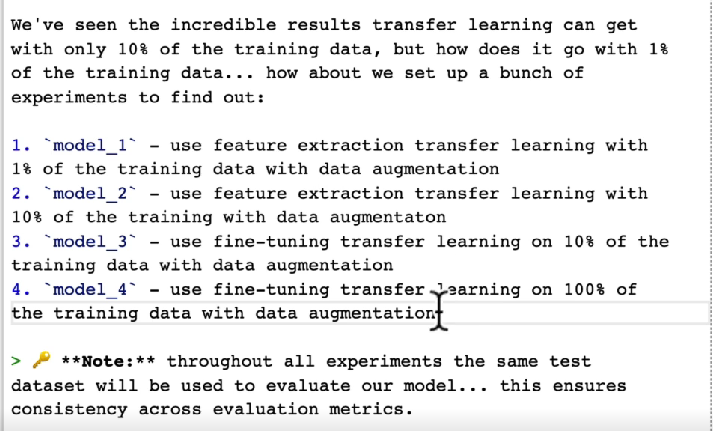

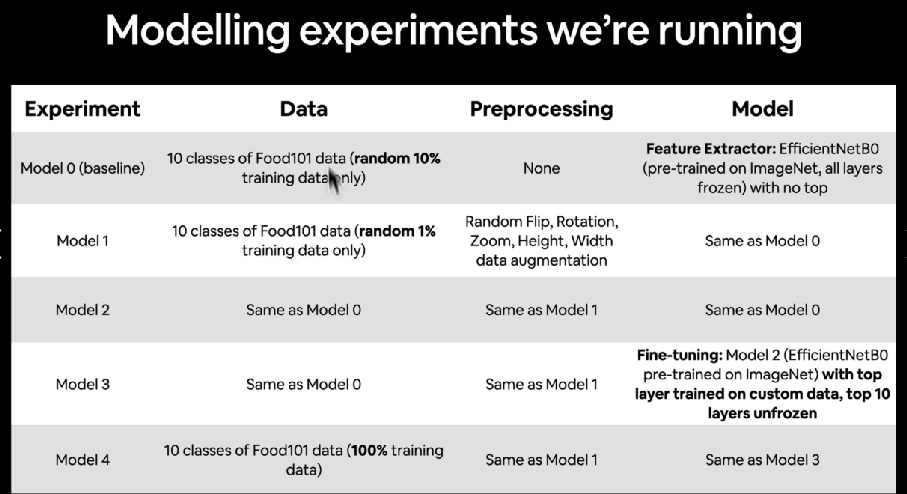

In [2]:
len(os.listdir('10_food_classes_1_percent/10_food_classes_1_percent/train/chicken_curry/'))

7

In [3]:
len(os.listdir('10_food_classes_1_percent/10_food_classes_1_percent/test/chicken_curry/'))

250

In [4]:
# Create train and test dir
train_dir_1_percent = '10_food_classes_1_percent/10_food_classes_1_percent/train/'
test_dir_1_percent = '10_food_classes_1_percent/10_food_classes_1_percent/test/'

In [185]:
# Create train and test data
train_data_1_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir_1_percent,
                                                                           label_mode='categorical',
                                                                           image_size=(224, 224),
                                                                           batch_size=32)

test_data_1_percent = tf.keras.preprocessing.image_dataset_from_directory(test_dir_1_percent,
                                                                          label_mode='categorical',
                                                                          image_size=(224, 224),
                                                                          batch_size=32)

Found 70 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


## 5.10 Adding data augmentation right into our model

To add data augmentation right into our model, we can use the layers inside
>`tf.keras.layers.experimental.preprocessing()`

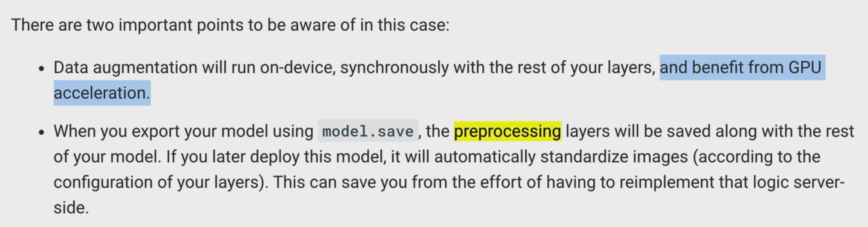

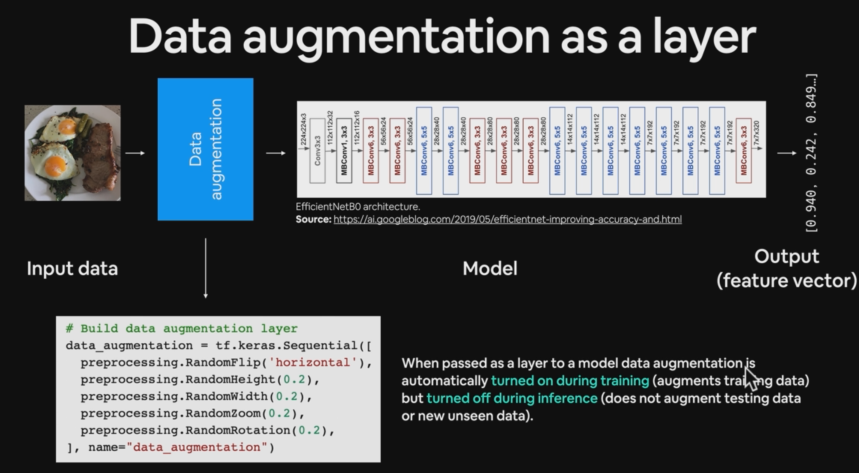

In [186]:
from tensorflow.keras import layers

In [195]:
# Create data augmentation stage
data_augmentation = Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
#     layers.Rescaling(1/255)  EfficientNet has built-in rescaling feature
], name='data_augmentation')

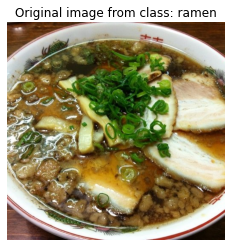

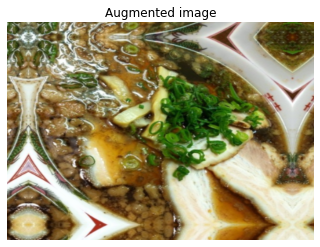

In [164]:
# Visualize our data augmentation layer
target_class = np.random.choice(train_data_1_percent.class_names)
target_dir = '10_food_classes_1_percent/10_food_classes_1_percent/train/' + target_class
random_image = np.random.choice(os.listdir(target_dir))
random_image = target_dir + '/' + random_image
img = plt.imread(random_image)
plt.imshow(img)
plt.title(f'Original image from class: {target_class}')
plt.axis('off');

# Let's plot our augmented random image
augmented_img = data_augmentation(img/255)
plt.figure()
plt.imshow(augmented_img)
plt.title('Augmented image')
plt.axis('off');

## Model_1 : Feature extraction transfer learning with 1% of data with data augmentation

In [165]:
train_data_1_percent, test_data_1_percent

(<BatchDataset shapes: ((None, 224, 224, 3), (None, 10)), types: (tf.float32, tf.float32)>,
 <BatchDataset shapes: ((None, 224, 224, 3), (None, 10)), types: (tf.float32, tf.float32)>)

In [166]:
len(train_data_1_percent), len(test_data_1_percent)

(3, 79)

In [197]:
# Setup input shape and base model, freezing the base model layers
input_shape=(224, 224, 3)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Create input layers
inputs = layers.Input(shape=input_shape, name='input_layer')

# Adding data augmentation as a layer
x = data_augmentation(inputs)

# Give base model the inputs (after augmented) and don't train it (model -> in inside)
x = base_model(x, training=False)

# Pool output features of the base model (layer -> right hand side)
x = layers.GlobalAveragePooling2D(name='global_avg_pooling_Layer')(x)

# Put the dense layers as an output
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Make a model using the inputs and outputs
model_1 = tf.keras.Model(inputs, outputs)

# Compile the model
model_1.compile(optimizer=Adam(),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

# Fit the model
history_2_1percent = model_1.fit(train_data_1_percent,
                                 steps_per_epoch=len(train_data_1_percent),
                                 validation_data=test_data_1_percent,
                                 validation_steps=int(0.25 * len(test_data_1_percent)),
                                 epochs=10,
                                 callbacks=TensorBoard(log_dir='transfer_learning/1_percent_model/model_1'))

ERROR:tensorflow:Failed to start profiler: Another profiler is running.
Epoch 1/10
3/3 [==============================] - 12s 3s/step - loss: 2.3627 - accuracy: 0.1143 - val_loss: 2.2036 - val_accuracy: 0.2286
Epoch 2/10
3/3 [==============================] - 4s 2s/step - loss: 2.0768 - accuracy: 0.2571 - val_loss: 2.0814 - val_accuracy: 0.3257
Epoch 3/10
3/3 [==============================] - 4s 2s/step - loss: 1.9359 - accuracy: 0.4143 - val_loss: 1.9717 - val_accuracy: 0.3783
Epoch 4/10
3/3 [==============================] - 4s 2s/step - loss: 1.7870 - accuracy: 0.5429 - val_loss: 1.8582 - val_accuracy: 0.4474
Epoch 5/10
3/3 [==============================] - 5s 2s/step - loss: 1.6111 - accuracy: 0.6429 - val_loss: 1.7824 - val_accuracy: 0.4885
Epoch 6/10
3/3 [==============================] - 4s 2s/step - loss: 1.4543 - accuracy: 0.7286 - val_loss: 1.7078 - val_accuracy: 0.5164
Epoch 7/10
3/3 [==============================] - 4s 2s/step - loss: 1.3781 - accuracy: 0.8000 - val_loss

In [198]:
model_1.summary()

Model: "model_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
data_augmentation (Sequentia (None, None, None, 3)     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
global_avg_pooling_Layer (Gl (None, 1280)              0         
_________________________________________________________________
output_layer (Dense)         (None, 10)                12810     
Total params: 4,062,381
Trainable params: 12,810
Non-trainable params: 4,049,571
_________________________________________________________________


In [200]:
results_1_percent_model = model_1.evaluate(test_data_1_percent)
results_1_percent_model

79/79 [==============================] - 12s 138ms/step - loss: 1.4601 - accuracy: 0.6260


[1.460084319114685, 0.6259999871253967]

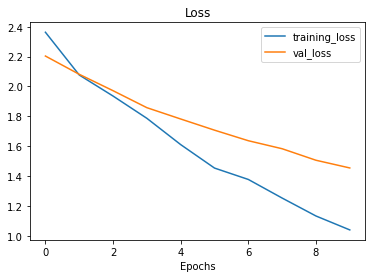

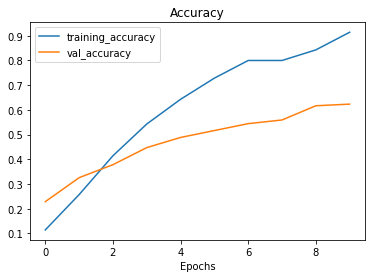

In [201]:
helper.plot_loss_curves(history_2_1percent)

## Model_1 : Feature extraction transfer learning with 10% of data with data augmentation

In [202]:
# Create train and test dir
train_dir_10_percent = '10_food_classes_10_percent/10_food_classes_10_percent/train/'
test_dir_10_percent = '10_food_classes_10_percent/10_food_classes_10_percent/test/'

# Create train and test data
train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir_10_percent,
                                                                            image_size=(224, 224),
                                                                            label_mode='categorical')
test_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(test_dir_10_percent,
                                                                           image_size=(224, 224),
                                                                           label_mode='categorical')

Found 750 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


>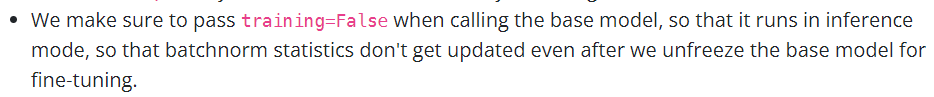

In [204]:
len(train_data_10_percent), len(test_data_10_percent)

(24, 79)

In [208]:
# Create a model
tf.random.set_seed(42)

# Create augmented layer
augmented_layer = Sequential([
    layers.RandomHeight(0.2),
    layers.RandomRotation(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    layers.RandomFlip('horizontal'),
], name='augmented_layer')

# Create a frozen base model (backbone)
base_model = tf.keras.applications.EfficientNetB0(include_top=False) # Top means 'output' 
base_model.trainable = False # We aren't gonna train the model based on our data, we use pre-learn pattern

# Create inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Put the inputs to augmented layer and then plug them to base mode
x = augmented_layer(inputs)
x = base_model(x, training=False) # Pass augmented images to base model but keep it in inference mode (weight not updtaed), and ensures batchnorm layer not updated

# Feature extraction with GlobalAveragePooling2D
x = layers.GlobalAveragePooling2D(name='global_avg_pooling_layer')(x)

# Create output layer
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Pass the input and output to model
model_2 = tf.keras.Model(inputs, outputs)

# Compile the model
model_2.compile(optimizer=Adam(),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

# Fit the model
history_1_10_Percent = model_2.fit(train_data_10_percent,
                                   epochs=10,
                                   steps_per_epoch=len(train_data_10_percent),
                                   validation_data=test_data_10_percent,
                                   validation_steps=len(test_data_10_percent),
                                   callbacks=TensorBoard(log_dir='transfer_learning/10_percent_model/model_1'))

ERROR:tensorflow:Failed to start profiler: Another profiler is running.


C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/10
24/24 [==============================] - 42s 1s/step - loss: 2.0965 - accuracy: 0.2773 - val_loss: 1.5778 - val_accuracy: 0.5732
Epoch 2/10
24/24 [==============================] - 24s 968ms/step - loss: 1.4243 - accuracy: 0.6267 - val_loss: 1.1247 - val_accuracy: 0.7392
Epoch 3/10
24/24 [==============================] - 23s 955ms/step - loss: 1.1149 - accuracy: 0.7187 - val_loss: 0.9085 - val_accuracy: 0.7832
Epoch 4/10
24/24 [==============================] - 24s 989ms/step - loss: 0.9256 - accuracy: 0.7693 - val_loss: 0.7910 - val_accuracy: 0.8092
Epoch 5/10
24/24 [==============================] - 23s 934ms/step - loss: 0.8149 - accuracy: 0.7973 - val_loss: 0.7132 - val_accuracy: 0.8164
Epoch 6/10
24/24 [==============================] - 24s 985ms/step - loss: 0.7401 - accuracy: 0.8120 - val_loss: 0.6698 - val_accuracy: 0.8236
Epoch 7/10
24/24 [==============================] - 26s 1s/step - loss: 0.6756 - accuracy: 0.8360 - val_loss: 0.6339 - val_accuracy: 0.8296
Epoch

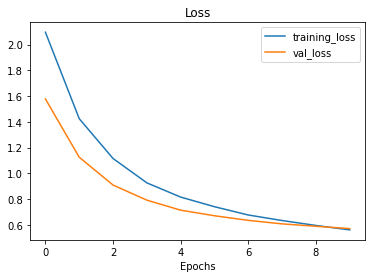

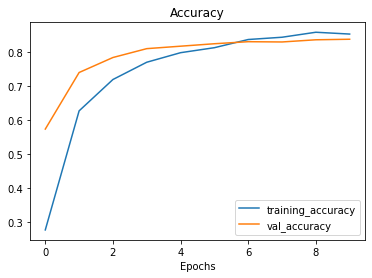

In [210]:
helper.plot_loss_curves(history_1_10_Percent)

## Creating model checkpoint callback

>The ModelCheckpoint callback intermediately saves our model (full model or just weights) during training. This is useful so we can come and sart where we left off.

In [211]:
# Create a model
tf.random.set_seed(42)

# Create augmented layer
augmented_layer = Sequential([
    layers.RandomHeight(0.2),
    layers.RandomRotation(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    layers.RandomFlip('horizontal'),
], name='augmented_layer')

# Create a frozen base model (backbone)
base_model = tf.keras.applications.EfficientNetB0(include_top=False) # Top means 'output' 
base_model.trainable = False # We aren't gonna train the model based on our data, we use pre-learn pattern

# Create inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Put the inputs to augmented layer and then plug them to base mode
x = augmented_layer(inputs)
x = base_model(x, training=False) # Pass augmented images to base model but keep it in inference mode (weight not updtaed), and ensures batchnorm layer not updated

# Feature extraction with GlobalAveragePooling2D
x = layers.GlobalAveragePooling2D(name='global_avg_pooling_layer')(x)

# Create output layer
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Pass the input and output to model
model_3 = tf.keras.Model(inputs, outputs)

# Compile the model
model_3.compile(optimizer=Adam(),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

# Creating ModelCheckpoints
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/10_percent_model/model_2.ckpt',
                                                monitor='val_loss',
                                                save_weights_only=True,
                                                verbose=1)


# Fit the model
history_1_10_Percent = model_3.fit(train_data_10_percent,
                                   epochs=10,
                                   steps_per_epoch=len(train_data_10_percent),
                                   validation_data=test_data_10_percent,
                                   validation_steps=len(test_data_10_percent),
                                   callbacks=[TensorBoard(log_dir='transfer_learning/10_percent_model/model_2'), checkpoint])

ERROR:tensorflow:Failed to start profiler: Another profiler is running.


C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/10
24/24 [==============================] - 32s 999ms/step - loss: 2.1110 - accuracy: 0.2627 - val_loss: 1.5879 - val_accuracy: 0.5740

Epoch 00001: saving model to transfer_learning/10_percent_model\model_2.ckpt
Epoch 2/10
24/24 [==============================] - 21s 855ms/step - loss: 1.4267 - accuracy: 0.6453 - val_loss: 1.1217 - val_accuracy: 0.7416

Epoch 00002: saving model to transfer_learning/10_percent_model\model_2.ckpt
Epoch 3/10
24/24 [==============================] - 22s 873ms/step - loss: 1.1355 - accuracy: 0.7080 - val_loss: 0.9169 - val_accuracy: 0.7728

Epoch 00003: saving model to transfer_learning/10_percent_model\model_2.ckpt
Epoch 4/10
24/24 [==============================] - 22s 877ms/step - loss: 0.9594 - accuracy: 0.7640 - val_loss: 0.7931 - val_accuracy: 0.8044

Epoch 00004: saving model to transfer_learning/10_percent_model\model_2.ckpt
Epoch 5/10
24/24 [==============================] - 22s 882ms/step - loss: 0.8294 - accuracy: 0.7973 - val_loss: 0.7

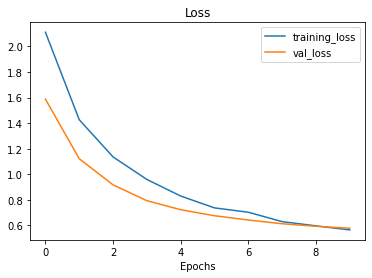

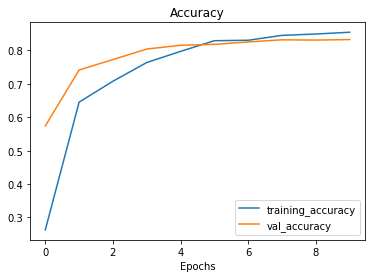

In [212]:
helper.plot_loss_curves(history_1_10_Percent)

## Loading in specific checkpoints weights

In [216]:
model_3.load_weights('transfer_learning/10_percent_model/model_2.ckpt')

In [217]:
loaded_weights_result = model_3.evaluate(test_data_10_percent)

79/79 [==============================] - 18s 204ms/step - loss: 0.5775 - accuracy: 0.8328


In [218]:
loaded_weights_result

[0.577495813369751, 0.8327999711036682]

## 5.11 `Model 4 - Fine tuning`

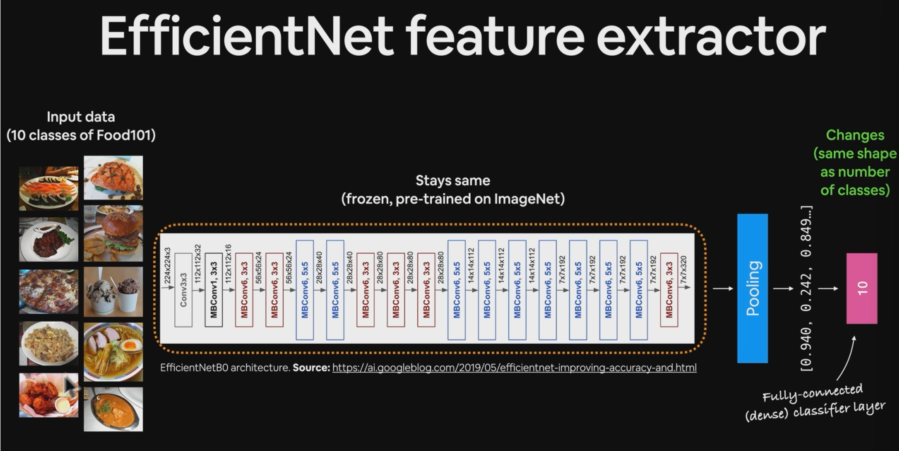
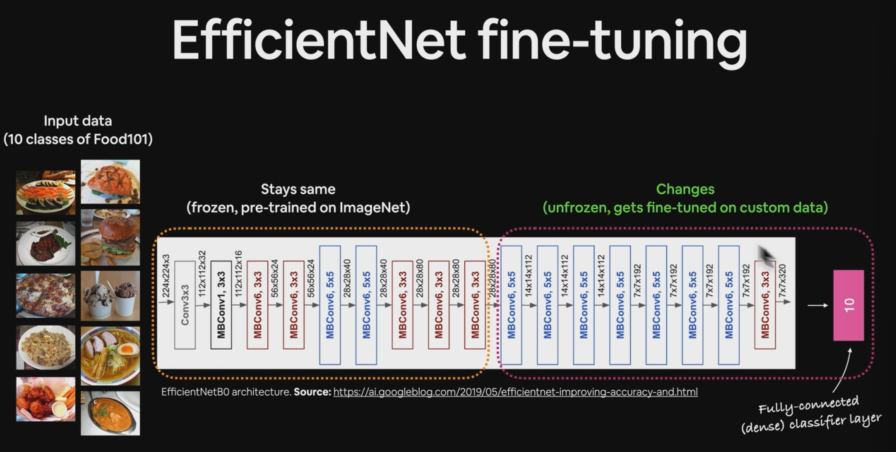

>Last layer learn small features, the beginning layer learn big features (such as roundness etc)

> **🔑Note:** Fine-tunning usually works best after training a feature extraction model for few epochs with large amounts of custom data

In [219]:
# layers in loaded weights model
model_3.layers

In [220]:
# Are these layers trainable?
model_3.layers[0].trainable

True

In [221]:
for layer in model_3.layers:
    print(layer, layer.trainable)

<keras.engine.input_layer.InputLayer object at 0x000001DBDB4E4E80> True
<keras.engine.sequential.Sequential object at 0x000001DBF42E4880> True
<keras.engine.functional.Functional object at 0x000001DB67BA1790> False
<keras.layers.pooling.GlobalAveragePooling2D object at 0x000001DB7CFCA310> True
<keras.layers.core.Dense object at 0x000001DB67BE05B0> True


In [227]:
model_3.layers[2].layers[:5]

In [223]:
for i, layer in enumerate(model_3.layers[2].layers):
    print(i, layer.name, layer.trainable) 

0 input_33 False
1 rescaling_38 False
2 normalization_31 False
3 stem_conv_pad False
4 stem_conv False
5 stem_bn False
6 stem_activation False
7 block1a_dwconv False
8 block1a_bn False
9 block1a_activation False
10 block1a_se_squeeze False
11 block1a_se_reshape False
12 block1a_se_reduce False
13 block1a_se_expand False
14 block1a_se_excite False
15 block1a_project_conv False
16 block1a_project_bn False
17 block2a_expand_conv False
18 block2a_expand_bn False
19 block2a_expand_activation False
20 block2a_dwconv_pad False
21 block2a_dwconv False
22 block2a_bn False
23 block2a_activation False
24 block2a_se_squeeze False
25 block2a_se_reshape False
26 block2a_se_reduce False
27 block2a_se_expand False
28 block2a_se_excite False
29 block2a_project_conv False
30 block2a_project_bn False
31 block2b_expand_conv False
32 block2b_expand_bn False
33 block2b_expand_activation False
34 block2b_dwconv False
35 block2b_bn False
36 block2b_activation False
37 block2b_se_squeeze False
38 block2b_se_re

In [243]:
# How many trainable variable in base model
print(len(model_3.layers[2].trainable_variables))

10


In [240]:
# last 10 layers trainable = True
base_model.trainable = True
for layer in base_model.layers[:-10]: # Every layer except last 10 layers being freezed
    layer.trainable = False
    
# Recompile the model
model_3.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(learning_rate=0.0001), # Set lower learning rate by 10x (when using fine-tuning)
                metrics='accuracy')

>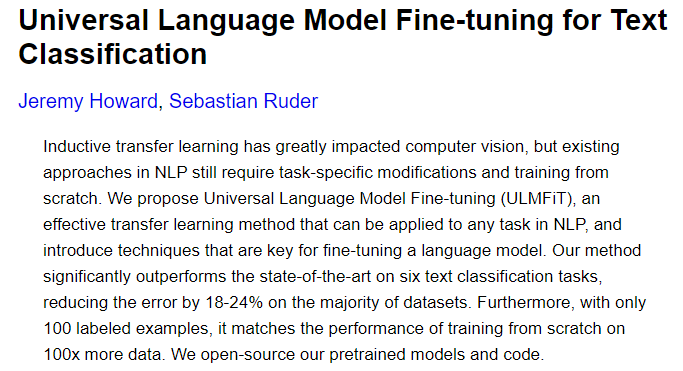

In [245]:
len(model_3.layers[2].trainable_variables)

10

In [241]:
for layer in base_model.layers[-10:]: # Layers are trainable
    print(layer.name, layer.trainable)

block7a_se_squeeze True
block7a_se_reshape True
block7a_se_reduce True
block7a_se_expand True
block7a_se_excite True
block7a_project_conv True
block7a_project_bn True
top_conv True
top_bn True
top_activation True


In [242]:
for layer_number, layer in enumerate(base_model.layers):
    print(layer_number, layer.name, layer.trainable)

0 input_33 False
1 rescaling_38 False
2 normalization_31 False
3 stem_conv_pad False
4 stem_conv False
5 stem_bn False
6 stem_activation False
7 block1a_dwconv False
8 block1a_bn False
9 block1a_activation False
10 block1a_se_squeeze False
11 block1a_se_reshape False
12 block1a_se_reduce False
13 block1a_se_expand False
14 block1a_se_excite False
15 block1a_project_conv False
16 block1a_project_bn False
17 block2a_expand_conv False
18 block2a_expand_bn False
19 block2a_expand_activation False
20 block2a_dwconv_pad False
21 block2a_dwconv False
22 block2a_bn False
23 block2a_activation False
24 block2a_se_squeeze False
25 block2a_se_reshape False
26 block2a_se_reduce False
27 block2a_se_expand False
28 block2a_se_excite False
29 block2a_project_conv False
30 block2a_project_bn False
31 block2b_expand_conv False
32 block2b_expand_bn False
33 block2b_expand_activation False
34 block2b_dwconv False
35 block2b_bn False
36 block2b_activation False
37 block2b_se_squeeze False
38 block2b_se_re

In [247]:
history_1_10_Percent.epoch[-1]

9

In [248]:
# Creating ModelCheckpoints
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/10_percent_model/model_3.ckpt',
                                                monitor='val_loss',
                                                save_weights_only=True,
                                                verbose=1,
                                                save_best_only=True)





# Fine tune with another 10 epochs
history_fine_10_percent = model_3.fit(train_data_10_percent,
                                      steps_per_epoch=len(train_data_10_percent),
                                      epochs=20, # 10 feature extraction, 10 fine-tuning
                                      validation_data=test_data_10_percent,
                                      validation_steps=len(test_data_10_percent),
                                      initial_epoch=history_1_10_Percent.epoch[-1],
                                      callbacks=[TensorBoard(log_dir='transfer_learning/10_percent_model/model_3'), checkpoint])

ERROR:tensorflow:Failed to start profiler: Another profiler is running.


C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 10/20
24/24 [==============================] - 34s 974ms/step - loss: 0.5058 - accuracy: 0.8547 - val_loss: 0.5052 - val_accuracy: 0.8372

Epoch 00010: val_loss improved from inf to 0.50517, saving model to transfer_learning/10_percent_model\model_3.ckpt
Epoch 11/20
24/24 [==============================] - 22s 912ms/step - loss: 0.3970 - accuracy: 0.8880 - val_loss: 0.4890 - val_accuracy: 0.8384

Epoch 00011: val_loss improved from 0.50517 to 0.48905, saving model to transfer_learning/10_percent_model\model_3.ckpt
Epoch 12/20
24/24 [==============================] - 20s 824ms/step - loss: 0.3697 - accuracy: 0.8867 - val_loss: 0.4828 - val_accuracy: 0.8448

Epoch 00012: val_loss improved from 0.48905 to 0.48278, saving model to transfer_learning/10_percent_model\model_3.ckpt
Epoch 13/20
24/24 [==============================] - 22s 904ms/step - loss: 0.3235 - accuracy: 0.9040 - val_loss: 0.4814 - val_accuracy: 0.8424

Epoch 00013: val_loss improved from 0.48278 to 0.48142, saving m

In [249]:
model_3.evaluate(test_data_10_percent)

79/79 [==============================] - 16s 192ms/step - loss: 0.4801 - accuracy: 0.8436


[0.48014771938323975, 0.8435999751091003]

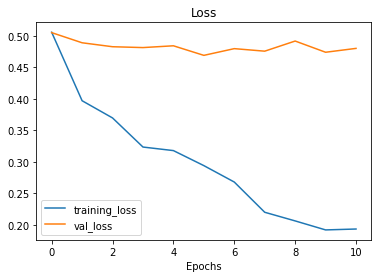

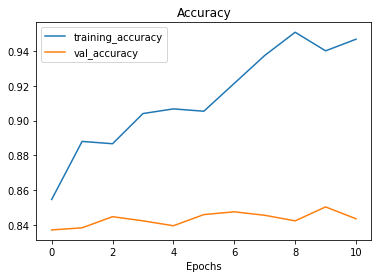

In [250]:
helper.plot_loss_curves(history_fine_10_percent)

In [171]:
# Let's create a function to compare training histories
def compare_history(original_history, new_history, initial_epochs=10):
    acc = original_history.history['accuracy']
    loss = original_history.history['loss']
    
    val_acc = original_history.history['val_accuracy']
    val_loss = original_history.history['val_loss']
    
    # Combine two accuracy and loss
    total_acc = acc + new_history.history['accuracy']
    total_loss = loss + new_history.history['loss']
    
    total_val_acc = val_acc + new_history.history['val_accuracy']
    total_val_loss = val_loss + new_history.history['val_loss']
    
    plt.figure(figsize=(12,4))
    plt.subplot(1, 2, 1)
    plt.plot(total_acc, label='train_acc')
    plt.plot(total_val_acc, label='val_acc')
    plt.vlines(x=initial_epochs, ymax=1, ymin=0, colors='red', linestyles='dashed')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(total_loss, label='train_loss')
    plt.plot(total_val_loss, label='val_loss')
    plt.vlines(x=initial_epochs, ymax=np.max(total_loss), ymin=0, colors='red', linestyles='dashed')
    plt.legend()

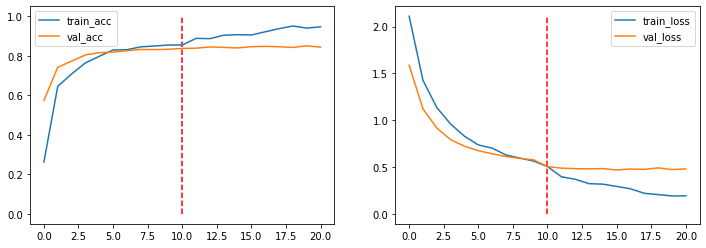

In [320]:
compare_history(history_1_10_Percent, history_fine_10_percent)

## 5.12 `Model 5 with 100% data`

In [9]:
# Create train test dir
train_dir_100_percent = '10_food_classes_all_data/train/'
test_dir_100_percent = '10_food_classes_all_data/test/'

# Create train and test data
train_data_100_percent = tf.keras.preprocessing.image_dataset_from_directory(train_dir_100_percent,
                                                                             label_mode='categorical',
                                                                             image_size=(224, 224))
test_data_100_percent = tf.keras.preprocessing.image_dataset_from_directory(test_dir_100_percent,
                                                                            label_mode='categorical',
                                                                            image_size=(224, 224))

Found 7500 files belonging to 10 classes.
Found 2500 files belonging to 10 classes.


In [334]:
# Set a random seed
tf.random.set_seed(42)

# Create image augmentation
image_augmentation = Sequential([ # We aren't rescalling
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    layers.RandomRotation(0.2),
    layers.RandomFlip('horizontal')
])

# Create the inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Create base model (backbone)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False
    
# Pass the input to image augmentation (we augmented input image first)
x = image_augmentation(inputs) 

# Pass the augmented image to base model
x = base_model(x, training=False) # Use inference mode (weights aren't gonna updated)

# Use feature extraction
x = layers.GlobalAveragePooling2D(name='global_avg_pooling_layer')(x)

# Output layer
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Passing the inputs and outputs to the model
model_6 = tf.keras.Model(inputs, outputs)

# Compile the model
model_6.compile(optimizer=Adam(),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

# Create a ModelChekpoint callback
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/100_percent_model/model_3.ckpt',
                                                save_best_only=True,
                                                save_weights_only=True,
                                                verbose=1)


# Fit the model
history_model_6_a = model_6.fit(train_data_100_percent,
                               steps_per_epoch=len(train_data_100_percent),
                               validation_data=test_data_100_percent,
                               validation_steps=len(test_data_100_percent),
                               epochs=5,
                               callbacks=[TensorBoard(log_dir='transfer_learning/100_percent_model/baseline_model'), checkpoint])

ERROR:tensorflow:Failed to start profiler: Another profiler is running.


C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/5
235/235 [==============================] - 83s 322ms/step - loss: 1.1142 - accuracy: 0.6657 - val_loss: 0.5327 - val_accuracy: 0.8480

Epoch 00001: val_loss improved from inf to 0.53268, saving model to transfer_learning/100_percent_model\model_3.ckpt
Epoch 2/5
235/235 [==============================] - 78s 326ms/step - loss: 0.6965 - accuracy: 0.7800 - val_loss: 0.4442 - val_accuracy: 0.8640

Epoch 00002: val_loss improved from 0.53268 to 0.44421, saving model to transfer_learning/100_percent_model\model_3.ckpt
Epoch 3/5
235/235 [==============================] - 77s 322ms/step - loss: 0.6318 - accuracy: 0.8063 - val_loss: 0.4039 - val_accuracy: 0.8768

Epoch 00003: val_loss improved from 0.44421 to 0.40388, saving model to transfer_learning/100_percent_model\model_3.ckpt
Epoch 4/5
235/235 [==============================] - 80s 334ms/step - loss: 0.5833 - accuracy: 0.8167 - val_loss: 0.3922 - val_accuracy: 0.8736

Epoch 00004: val_loss improved from 0.40388 to 0.39216, savin

In [338]:
# Load best weights
model_6.load_weights('transfer_learning/100_percent_model/model_3.ckpt')

# Fine-tuning the model
base_model.trainable = True
for layer in base_model.layers[:-10]: # Freezed all layers except the last 10 layers
    layer.trainable = False
    
# Re-compile the model
model_6.compile(optimizer=Adam(learning_rate=0.0001), # Set lower learning rate by 10x from default learning rate
                loss=CategoricalCrossentropy(),
                metrics='accuracy')


# Re-fit the model
history_model_6_b = model_6.fit(train_data_100_percent,
                               steps_per_epoch=len(train_data_100_percent),
                               validation_data=test_data_100_percent,
                               validation_steps=len(test_data_100_percent),
                               epochs=10, # inital plus now
                               initial_epoch=history_model_6_a.epoch[-1],
                               callbacks=[TensorBoard(log_dir='transfer_learning/100_percent_model/fine_tuned_model'), checkpoint])

ERROR:tensorflow:Failed to start profiler: Another profiler is running.
Epoch 5/10
235/235 [==============================] - 98s 381ms/step - loss: 0.5093 - accuracy: 0.8316 - val_loss: 0.3532 - val_accuracy: 0.8836

Epoch 00005: val_loss improved from 0.38570 to 0.35316, saving model to transfer_learning/100_percent_model\model_3.ckpt
Epoch 6/10
235/235 [==============================] - 92s 384ms/step - loss: 0.4637 - accuracy: 0.8477 - val_loss: 0.3356 - val_accuracy: 0.8924

Epoch 00006: val_loss improved from 0.35316 to 0.33561, saving model to transfer_learning/100_percent_model\model_3.ckpt
Epoch 7/10
235/235 [==============================] - 99s 412ms/step - loss: 0.4095 - accuracy: 0.8683 - val_loss: 0.3262 - val_accuracy: 0.8940

Epoch 00007: val_loss improved from 0.33561 to 0.32620, saving model to transfer_learning/100_percent_model\model_3.ckpt
Epoch 8/10
235/235 [==============================] - 105s 437ms/step - loss: 0.3794 - accuracy: 0.8768 - val_loss: 0.3239 - va

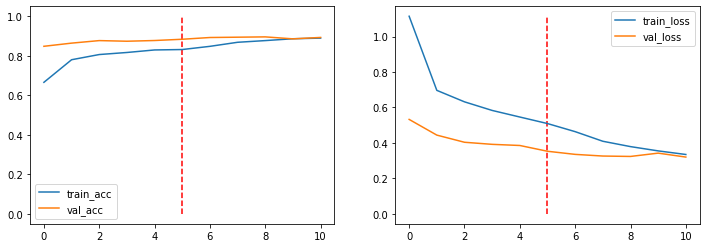

In [341]:
compare_history(history_model_6_a, history_model_6_b, initial_epochs=5)

In [16]:
# Set a random seed
tf.random.set_seed(42)

# Create image augmentation
image_augmentation = Sequential([ # We aren't rescalling
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    layers.RandomRotation(0.2),
    layers.RandomFlip('horizontal')
])

# Create the inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Create base model (backbone), now use the unfreezed last 10 layer
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = True
for layer in base_model.layers[:-10]:
    layer.trainable = False

# Pass the input to image augmentation (we augmented input image first)
x = image_augmentation(inputs) 

# Pass the augmented image to base model
x = base_model(x, training=False) # Use inference mode (weights aren't gonna updated)

# Use feature extraction
x = layers.GlobalAveragePooling2D(name='global_avg_pooling_layer')(x)

# Output layer
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Passing the inputs and outputs to the model
model_7 = tf.keras.Model(inputs, outputs)

# Load weights
model_7.load_weights('transfer_learning/100_percent_model\model_3.ckpt')

# Compile the model
model_7.compile(optimizer=Adam(),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

In [18]:
model_7.evaluate(test_data_100_percent)

79/79 [==============================] - 12s 115ms/step - loss: 0.3204 - accuracy: 0.8928


[0.3203717768192291, 0.892799973487854]

In [22]:
# Set random seed
tf.random.set_seed(42)

# Set inputs 
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Set augmentation sequential
augmentation = Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomZoom(0.2),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomRotation(0.2)
])

# Pass the inputs to augmentation sequential
x = augmentation(inputs)

# Set base model (backbone) and we aren't adjust the prelearn pattern
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False

# Pass the augmentation data to base mode with inference mode (weights not updated)
x = base_model(x, training=False)

# Set feature exraction layer (global avg pooling)
x = layers.GlobalAveragePooling2D(name='glob_avg_pooled_layer')(x)

# Set outputs
outputs = layers.Dense(10, activation='softmax', name='output_layer')(x)

# Pass the input and output to Model
model_8 = tf.keras.Model(inputs, outputs)

# Create tensorboard callback
tb_callback = tf.keras.callbacks.TensorBoard(log_dir='transfer_learning/100_percent_model/model_2')

# Create ModelCheckpoint callback
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/100_percent_model/model_2/model_2.ckpt',
                                                save_best_only=True,
                                                save_weights_only=True,
                                                verbose=1)

# Compile the model
model_8.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(),
                metrics='accuracy')

# Fit the model
history_model_8 = model_8.fit(train_data_100_percent,
                  epochs=10,
                  steps_per_epoch=len(train_data_100_percent),
                  validation_data=test_data_100_percent,
                  validation_steps=len(test_data_100_percent),
                  callbacks=[tb_callback, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/10
235/235 [==============================] - 115s 469ms/step - loss: 1.1065 - accuracy: 0.6651 - val_loss: 0.5394 - val_accuracy: 0.8364

Epoch 00001: val_loss improved from inf to 0.53940, saving model to transfer_learning/100_percent_model/model_2\model_2.ckpt
Epoch 2/10
235/235 [==============================] - 79s 335ms/step - loss: 0.6961 - accuracy: 0.7851 - val_loss: 0.4655 - val_accuracy: 0.8500

Epoch 00002: val_loss improved from 0.53940 to 0.46551, saving model to transfer_learning/100_percent_model/model_2\model_2.ckpt
Epoch 3/10
235/235 [==============================] - 70s 300ms/step - loss: 0.6156 - accuracy: 0.8069 - val_loss: 0.4313 - val_accuracy: 0.8604

Epoch 00003: val_loss improved from 0.46551 to 0.43126, saving model to transfer_learning/100_percent_model/model_2\model_2.ckpt
Epoch 4/10
235/235 [==============================] - 65s 275ms/step - loss: 0.5749 - accuracy: 0.8228 - val_loss: 0.4072 - val_accuracy: 0.8708

Epoch 00004: val_loss improved f

In [41]:
# Let's fine tuned model
model_8.load_weights('transfer_learning/100_percent_model/model_2\model_2.ckpt')

# Set 20 last layers as trainable layer
model_8.trainable = True
for layer in model_8.layers[2].layers[:-20]:
    layer.trainable = False
    
# Re-compile the model
model_8.compile(optimizer=Adam(learning_rate=0.0001),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

# Re-fit the model
history_model_8_b = model_8.fit(train_data_100_percent,
                    epochs=20,
                    steps_per_epoch=len(train_data_100_percent),
                    validation_data=test_data_100_percent,
                    validation_steps=len(test_data_100_percent),
                    initial_epoch=history_model_8.epoch[-1],
                    callbacks=[tb_callback, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 10/20
235/235 [==============================] - 55s 215ms/step - loss: 0.4475 - accuracy: 0.8533 - val_loss: 0.3400 - val_accuracy: 0.8880

Epoch 00010: val_loss improved from 0.37069 to 0.33996, saving model to transfer_learning/100_percent_model/model_2\model_2.ckpt
Epoch 11/20
235/235 [==============================] - 50s 211ms/step - loss: 0.3850 - accuracy: 0.8743 - val_loss: 0.3448 - val_accuracy: 0.8884

Epoch 00011: val_loss did not improve from 0.33996
Epoch 12/20
235/235 [==============================] - 47s 198ms/step - loss: 0.3214 - accuracy: 0.8964 - val_loss: 0.3420 - val_accuracy: 0.8896

Epoch 00012: val_loss did not improve from 0.33996
Epoch 13/20
235/235 [==============================] - 43s 183ms/step - loss: 0.2865 - accuracy: 0.9068 - val_loss: 0.3405 - val_accuracy: 0.8904

Epoch 00013: val_loss did not improve from 0.33996
Epoch 14/20
235/235 [==============================] - 46s 196ms/step - loss: 0.2617 - accuracy: 0.9119 - val_loss: 0.3444 - val_a

>Tensorboard: https://tensorboard.dev/experiment/6gnVl5o5TxO1s8Xw6TMnvg/

In [187]:
def predict_classes(image, model):
    image = tf.io.read_file(image)
    image = tf.image.decode_image(image)
    image = tf.image.resize(image, [224, 224]) 
    
    pred = model.predict(tf.expand_dims(image, axis=0))
    pred = np.argmax(pred)
    
    for i in range(len(train_data_100_percent.class_names)):
        if pred == i:
            pred = train_data_100_percent.class_names[i]
         
    plt.imshow(image/255)
    plt.axis('off')
    plt.title(pred)

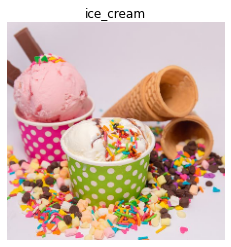

In [128]:
predict_classes('Preds/ice_cream_1.jpg', model_8)

# 5.13 Scaling Up

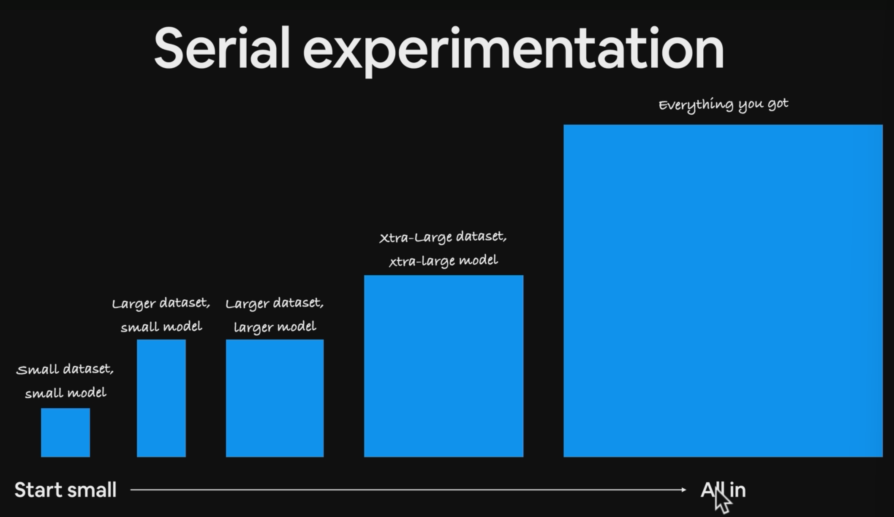

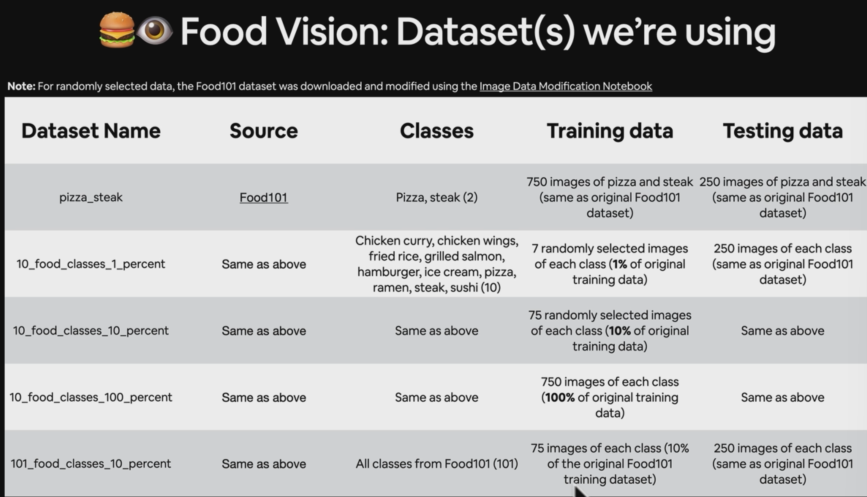

In [9]:
# Create train and test dir
train_dir = '101_food_classes_10_percent/train/'
test_dir = '101_food_classes_10_percent/test/'

# Create train and test data
train_data = tf.keras.preprocessing.image_dataset_from_directory(train_dir,
                                                                 label_mode='categorical',
                                                                 image_size=(224, 224))

test_data = tf.keras.preprocessing.image_dataset_from_directory(test_dir,
                                                                label_mode='categorical',
                                                                image_size=(224, 224),
                                                                shuffle=False)

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


In [151]:
len(train_data), len(test_data)

(237, 790)

In [154]:
# Set random seed
tf.random.set_seed(42)

# Set the inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Set the augmented sequential
augmented = Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    layers.RandomRotation(0.2)
], name='augmentation_layer')

# Pass the input image to augmented sequential
x = augmented(inputs) # augment images (only happen during training phase)

# Pass the augmented image to base model (backbone), we aren't going to change pre-learned pattern (freezed layer)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False
x = base_model(x, training=False) # Inference mode, we not going to change the weights so weights which need to stay frozen, stay frozen

# Set feature extraction layer
x = layers.GlobalAveragePooling2D(name='glob_avg_pooled_layer')(x)

# Set the outputs
outputs = layers.Dense(101, activation='softmax', name='output_layer')(x)

# Pass the input and output to the model
model_9 = tf.keras.Model(inputs, outputs)

# Compile the model
model_9.compile(optimizer=Adam(),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

# Create a callback
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/101_10_percent/model_1/model_1.ckpt',
                                                save_best_only=True,
                                                save_weights_only=True,
                                                verbose=1,
                                                monitor='val_accuracy')

tb_callback = tf.keras.callbacks.TensorBoard('transfer_learning/101_10_percent/model_1')


# Fit the model
history_9 = model_9.fit(train_data, 
                        epochs=5,
                        steps_per_epoch=len(train_data),
                        validation_data=test_data,
                        validation_steps=int(0.1 * len(test_data)),
                        callbacks=[tb_callback, checkpoint])

Epoch 1/10
237/237 [==============================] - 44s 168ms/step - loss: 3.4782 - accuracy: 0.2474 - val_loss: 2.6475 - val_accuracy: 0.4153

Epoch 00001: val_accuracy improved from -inf to 0.41535, saving model to transfer_learning/101_10_percent/model_1\model_1.ckpt
Epoch 2/10
237/237 [==============================] - 38s 160ms/step - loss: 2.3745 - accuracy: 0.4544 - val_loss: 2.2338 - val_accuracy: 0.4616

Epoch 00002: val_accuracy improved from 0.41535 to 0.46163, saving model to transfer_learning/101_10_percent/model_1\model_1.ckpt
Epoch 3/10
237/237 [==============================] - 37s 155ms/step - loss: 2.0049 - accuracy: 0.5197 - val_loss: 2.1166 - val_accuracy: 0.4723

Epoch 00003: val_accuracy improved from 0.46163 to 0.47231, saving model to transfer_learning/101_10_percent/model_1\model_1.ckpt
Epoch 4/10
237/237 [==============================] - 38s 159ms/step - loss: 1.7920 - accuracy: 0.5629 - val_loss: 2.0218 - val_accuracy: 0.4889

Epoch 00004: val_accuracy imp

In [156]:
model_9.evaluate(test_data)

790/790 [==============================] - 74s 94ms/step - loss: 1.6358 - accuracy: 0.5665


[1.6357882022857666, 0.5664554238319397]

In [178]:
model_9.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
augmentation_layer (Sequenti (None, None, None, 3)     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
glob_avg_pooled_layer (Globa (None, 1280)              0         
_________________________________________________________________
output_layer (Dense)         (None, 101)               129381    
Total params: 4,178,952
Trainable params: 910,821
Non-trainable params: 3,268,131
_________________________________________________________________


In [167]:
for i, layer in enumerate(model_9.layers[2].layers):
    print(i, layer.name, layer.trainable)

0 input_9 False
1 rescaling_8 False
2 normalization_8 False
3 stem_conv_pad False
4 stem_conv False
5 stem_bn False
6 stem_activation False
7 block1a_dwconv False
8 block1a_bn False
9 block1a_activation False
10 block1a_se_squeeze False
11 block1a_se_reshape False
12 block1a_se_reduce False
13 block1a_se_expand False
14 block1a_se_excite False
15 block1a_project_conv False
16 block1a_project_bn False
17 block2a_expand_conv False
18 block2a_expand_bn False
19 block2a_expand_activation False
20 block2a_dwconv_pad False
21 block2a_dwconv False
22 block2a_bn False
23 block2a_activation False
24 block2a_se_squeeze False
25 block2a_se_reshape False
26 block2a_se_reduce False
27 block2a_se_expand False
28 block2a_se_excite False
29 block2a_project_conv False
30 block2a_project_bn False
31 block2b_expand_conv False
32 block2b_expand_bn False
33 block2b_expand_activation False
34 block2b_dwconv False
35 block2b_bn False
36 block2b_activation False
37 block2b_se_squeeze False
38 block2b_se_resha

In [168]:
# Fine tuning the model, first load the weights
model_9.load_weights('transfer_learning/101_10_percent/model_1\model_1.ckpt')

# After that, we un-freezed the last 5 layers
model_9.trainable = True
for layer in model_9.layers[2].layers[:-5]:
    layer.trainable = False

# After adjusting something, let's recompile our model
model_9.compile(optimizer=Adam(learning_rate=0.0001), # Set lower learning rate by 10x from the default
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

# Let's re-fit our model
history_9b = model_9.fit(train_data,
                         epochs=20,
                         initial_epoch=history_9.epoch[-1],
                         steps_per_epoch=len(train_data),
                         validation_data=test_data,
                         validation_steps=int(0.1 *len(test_data)),
                         callbacks=[tb_callback, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 10/20
237/237 [==============================] - 52s 180ms/step - loss: 1.1264 - accuracy: 0.7047 - val_loss: 1.9028 - val_accuracy: 0.5115

Epoch 00010: val_accuracy improved from 0.45688 to 0.51147, saving model to transfer_learning/101_10_percent/model_2\model_2.ckpt
Epoch 11/20
237/237 [==============================] - 39s 164ms/step - loss: 1.0113 - accuracy: 0.7283 - val_loss: 1.9045 - val_accuracy: 0.5198

Epoch 00011: val_accuracy improved from 0.51147 to 0.51978, saving model to transfer_learning/101_10_percent/model_2\model_2.ckpt
Epoch 12/20
237/237 [==============================] - 39s 163ms/step - loss: 0.9499 - accuracy: 0.7451 - val_loss: 1.8728 - val_accuracy: 0.5249

Epoch 00012: val_accuracy improved from 0.51978 to 0.52492, saving model to transfer_learning/101_10_percent/model_2\model_2.ckpt
Epoch 13/20
237/237 [==============================] - 39s 162ms/step - loss: 0.9062 - accuracy: 0.7562 - val_loss: 1.9313 - val_accuracy: 0.5186

Epoch 00013: val_accur

In [169]:
model_9.evaluate(test_data)

790/790 [==============================] - 92s 116ms/step - loss: 1.6374 - accuracy: 0.5817


[1.637363076210022, 0.5817425847053528]

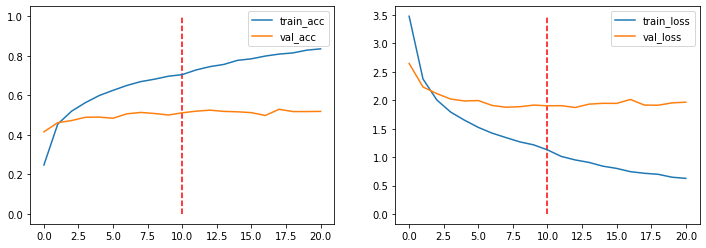

In [172]:
compare_history(history_9, history_9b)

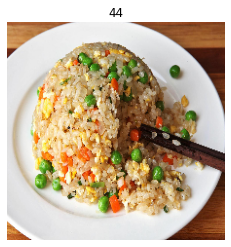

In [175]:
predict_classes('Preds/fried_rice_1.jpg', model_9)

In [176]:
train_data.class_names[44]

'fried_rice'

## 5.14 Evaluating the model

In [6]:
import helper_functions as helper

In [5]:
# Set random seed
tf.random.set_seed(42)

# Set the inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Set the augmented sequential
augmented = Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    layers.RandomRotation(0.2)
], name='augmentation_layer')

# Pass the input image to augmented sequential
x = augmented(inputs) # augment images (only happen during training phase)

# Pass the augmented image to base model (backbone), we aren't going to change pre-learned pattern (freezed layer)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = True
for layer in base_model.layers[:-5]:
    layer.trainable=False
x = base_model(x, training=False) # Inference mode, we not going to change the weights so weights which need to stay frozen, stay frozen

# Set feature extraction layer
x = layers.GlobalAveragePooling2D(name='glob_avg_pooled_layer')(x)

# Set the outputs
outputs = layers.Dense(101, activation='softmax', name='output_layer')(x)

# Pass the input and output to the model
model_10 = tf.keras.Model(inputs, outputs)

# Compile the model
model_10.compile(optimizer=Adam(),
                loss=CategoricalCrossentropy(),
                metrics='accuracy')

In [7]:
model_10.load_weights('transfer_learning/101_10_percent/model_2\model_2.ckpt')

In [10]:
model_10.evaluate(test_data)

790/790 [==============================] - 106s 117ms/step - loss: 1.6184 - accuracy: 0.5838


[1.6183618307113647, 0.5837623476982117]

In [7]:
pred_probs = model_10.predict(test_data, verbose=1)

790/790 [==============================] - 76s 93ms/step


In [8]:
len(test_data)

790

In [9]:
len(pred_probs)

25250

In [15]:
pred_probs.shape

(25250, 101)

In [26]:
train_data.class_names[0]

'apple_pie'

In [24]:
np.argmax(pred_probs[:10], axis=1)

array([ 0,  0,  0,  8, 29, 78, 29, 46,  9,  0], dtype=int64)

In [27]:
test_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 101)), types: (tf.float32, tf.float32)>

In [16]:
# To get our test labels we need to unravel our test data BatchDataset
y_labels = []
for images, labels in test_data.unbatch():
    y_labels.append(np.argmax(labels))

In [17]:
y_labels[:10]

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [34]:
len(y_labels)

25250

In [11]:
pred = np.argmax(model_10.predict(test_data), axis=1)

In [12]:
pred[:10]

array([ 0,  0,  0,  8, 29, 78, 29, 46,  9,  0], dtype=int64)

In [13]:
train_data.class_names[90]

'spaghetti_bolognese'

In [14]:
pred_classes = []
for num in pred:
    preds = train_data.class_names[num]
    pred_classes.append(preds)

In [18]:
y_label_classes = []
for num in y_labels:
    y_label = train_data.class_names[num]
    y_label_classes.append(y_label)

In [19]:
y_label_classes[1000]

'beef_tartare'

In [20]:
pred_classes[:10]

['apple_pie',
 'apple_pie',
 'apple_pie',
 'bread_pudding',
 'cup_cakes',
 'poutine',
 'cup_cakes',
 'garlic_bread',
 'breakfast_burrito',
 'apple_pie']

In [65]:
from sklearn.metrics import ConfusionMatrixDisplay

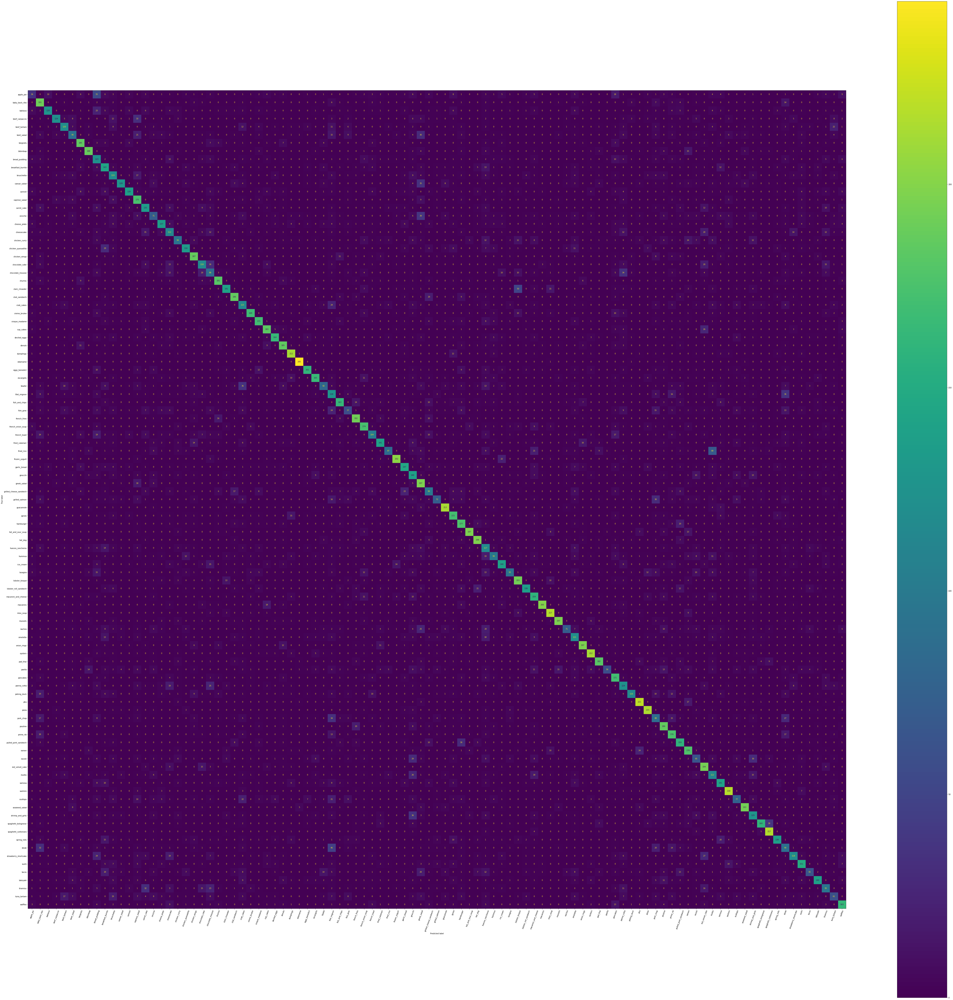

In [69]:
fig, ax = plt.subplots(figsize=(100, 100))
ConfusionMatrixDisplay.from_predictions(y_label_classes, pred_classes, ax=ax, xticks_rotation=70, )

In [3]:
from sklearn.metrics import classification_report

In [40]:
print(classification_report(y_labels, pred))

              precision    recall  f1-score   support

           0       0.33      0.14      0.20       250
           1       0.49      0.76      0.59       250
           2       0.81      0.51      0.63       250
           3       0.81      0.50      0.62       250
           4       0.54      0.48      0.51       250
           5       0.46      0.36      0.41       250
           6       0.69      0.74      0.71       250
           7       0.74      0.75      0.75       250
           8       0.28      0.49      0.36       250
           9       0.40      0.57      0.47       250
          10       0.40      0.48      0.44       250
          11       0.83      0.51      0.63       250
          12       0.75      0.56      0.64       250
          13       0.44      0.70      0.54       250
          14       0.51      0.54      0.52       250
          15       0.39      0.28      0.33       250
          16       0.62      0.55      0.58       250
          17       0.39    

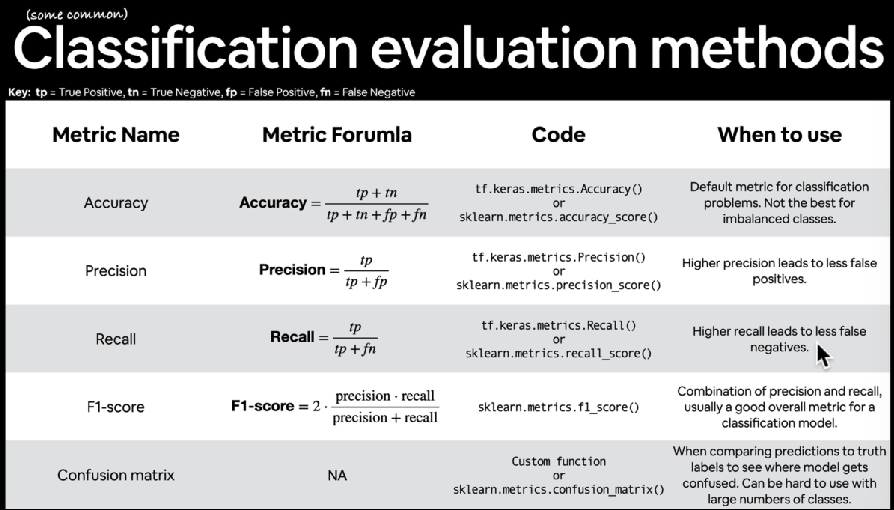

In [26]:
classification_dict = classification_report(y_labels, pred, output_dict=True)
classification_dict

{'0': {'precision': 0.3333333333333333,
  'recall': 0.144,
  'f1-score': 0.2011173184357542,
  'support': 250},
 '1': {'precision': 0.4860050890585242,
  'recall': 0.764,
  'f1-score': 0.5940902021772939,
  'support': 250},
 '2': {'precision': 0.810126582278481,
  'recall': 0.512,
  'f1-score': 0.627450980392157,
  'support': 250},
 '3': {'precision': 0.8104575163398693,
  'recall': 0.496,
  'f1-score': 0.6153846153846153,
  'support': 250},
 '4': {'precision': 0.5381165919282511,
  'recall': 0.48,
  'f1-score': 0.5073995771670191,
  'support': 250},
 '5': {'precision': 0.4639175257731959,
  'recall': 0.36,
  'f1-score': 0.4054054054054054,
  'support': 250},
 '6': {'precision': 0.6902985074626866,
  'recall': 0.74,
  'f1-score': 0.7142857142857143,
  'support': 250},
 '7': {'precision': 0.7401574803149606,
  'recall': 0.752,
  'f1-score': 0.746031746031746,
  'support': 250},
 '8': {'precision': 0.28211009174311924,
  'recall': 0.492,
  'f1-score': 0.358600583090379,
  'support': 250}

In [94]:
class_names = train_data.class_names

In [99]:
class_f1_scores =  {}
for key, value in classification_dict.items():
    if key == 'accuracy':
        break
    else: 
        class_f1_scores[class_names[int(key)]] = value['f1-score']

In [101]:
class_f1_scores

{'apple_pie': 0.2011173184357542,
 'baby_back_ribs': 0.5940902021772939,
 'baklava': 0.627450980392157,
 'beef_carpaccio': 0.6153846153846153,
 'beef_tartare': 0.5073995771670191,
 'beet_salad': 0.4054054054054054,
 'beignets': 0.7142857142857143,
 'bibimbap': 0.746031746031746,
 'bread_pudding': 0.358600583090379,
 'breakfast_burrito': 0.4735099337748344,
 'bruschetta': 0.43589743589743596,
 'caesar_salad': 0.6336633663366337,
 'cannoli': 0.6390804597701151,
 'caprese_salad': 0.5384615384615384,
 'carrot_cake': 0.5222437137330754,
 'ceviche': 0.3279445727482679,
 'cheese_plate': 0.5829787234042554,
 'cheesecake': 0.4171322160148976,
 'chicken_curry': 0.4552058111380145,
 'chicken_quesadilla': 0.5942350332594236,
 'chicken_wings': 0.7096774193548387,
 'chocolate_cake': 0.5021276595744681,
 'chocolate_mousse': 0.3259259259259259,
 'churros': 0.7168316831683169,
 'clam_chowder': 0.6211453744493393,
 'club_sandwich': 0.7167630057803468,
 'crab_cakes': 0.4049295774647887,
 'creme_brulee': 

In [102]:
# Turn dictionary to dataframe
df_f1 = pd.DataFrame(data={'class_names': class_f1_scores.keys(),
                           'f1_score': class_f1_scores.values()})

In [107]:
df_f1.head()

,class_names,f1_score
0,apple_pie,0.201117
1,baby_back_ribs,0.594090
2,baklava,0.627451
3,beef_carpaccio,0.615385
4,beef_tartare,0.507400


In [108]:
df_f1_sorted = df_f1.sort_values(ascending=False, by='f1_score')

In [111]:
df_f1_sorted[:5]

,class_names,f1_score
33,edamame,0.955166
63,macarons,0.867679
75,pho,0.824627
45,frozen_yogurt,0.822811
54,hot_and_sour_soup,0.820833


In [112]:
df_f1_sorted[-5:]

,class_names,f1_score
93,steak,0.320856
82,ravioli,0.303738
99,tuna_tartare,0.299020
39,foie_gras,0.292308
0,apple_pie,0.201117


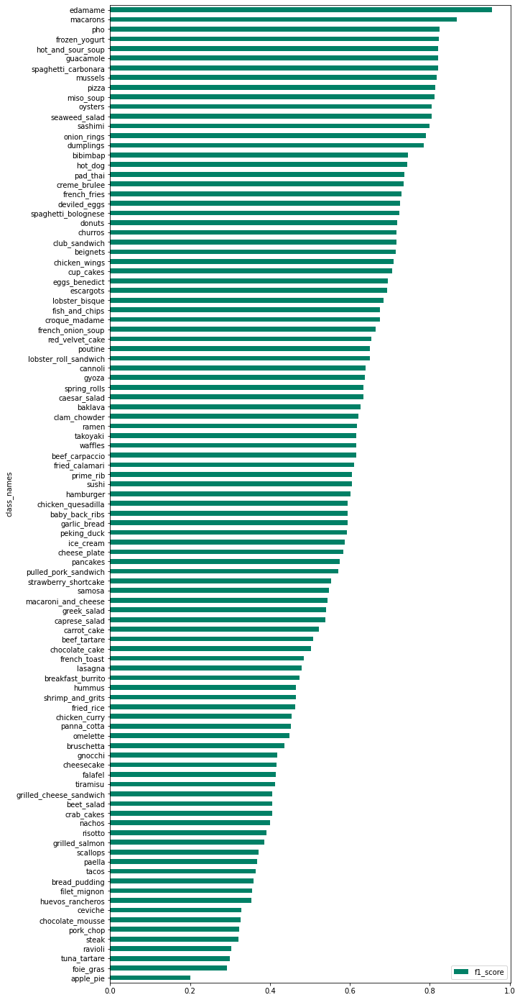

In [184]:
fig, ax = plt.subplots()
df_f1_sorted.plot.barh(x='class_names', figsize=(10, 25), cmap='summer', ax=ax)
ax.invert_yaxis();

In [185]:
img = plt.imread('101_food_classes_10_percent/train/apple_pie/1026328.jpg')

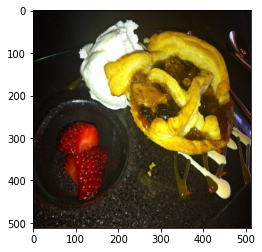

In [186]:
plt.imshow(img)

In [35]:
def predict_classes_101(image, model):
    img = tf.io.read_file(image)
    img = tf.image.decode_image(img) # turn images into tensor
    img = tf.image.resize(img, size=(224, 224))
    
    pred = model.predict(tf.expand_dims(img, axis=0))
    pred = np.argmax(pred)
    
    for i in range(len(train_data_101.class_names)):
        if pred == i:
            pred = train_data_101.class_names[i]
            
    plt.imshow(img/255)
    plt.title(pred)
    plt.axis('off')

In [36]:
predict_classes_101('Preds/cheese_cake_1.jpg', model_10)

NameError: name 'model_10' is not defined

In [25]:
def pick_test_image(model):
    
    plt.figure(figsize=(12, 12))
    for i in range(4):
        plt.subplot(2, 2, i+1)
        # Get random class
        class_names = train_data_101.class_names
        random_class = np.random.choice(class_names)
        # Set the path of classes
        path = '101_food_classes_10_percent/test/' + random_class
        # Get the random images
        random_images = np.random.choice(os.listdir(path))
        # Set the path of images
        random_img_path = path + '/' + random_images
        
        # Read the image file
        img = tf.io.read_file(random_img_path)
        # Decode into tensor from string
        img = tf.image.decode_image(img)
        # Resize the image
        img = tf.image.resize(img, size=(224, 224))

        # Predict the image
        pred = model.predict(tf.expand_dims(img, axis=0))
        pred_probs = np.max(pred)
        pred = np.argmax(pred)
        for i in range(len(class_names)):
            if pred == i:
                pred = class_names[i]
        
        # Set the color
        if pred == random_class:
            color = 'green'
        else:
            color = 'red'
            
        # Plot the image
        plt.imshow(img/255)
        plt.title(f'Actual: {random_class}, Pred: {pred}, Prob:{pred_probs*100:.2f}%', color=color, fontsize=12)
        plt.axis(False)

In [26]:
pick_test_image(model_10)

NameError: name 'model_10' is not defined

## 5.15 Finding the most wrong predictions

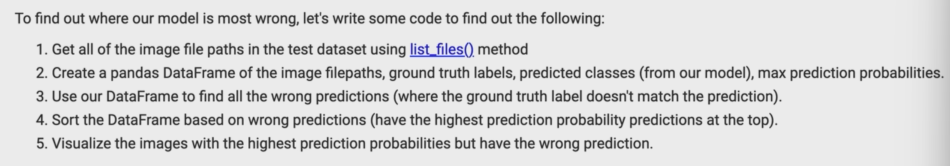

In [288]:
file_path = []
for path in test_data.list_files('101_food_classes_10_percent/test/*/*.jpg',
                                 shuffle=False):
    file_path.append(path.numpy())

In [289]:
file_path[:10]

[b'101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\101251.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1034399.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\103801.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1038694.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1047447.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1068632.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\110043.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1106961.jpg',
 b'101_food_classes_10_percent\\test\\apple_pie\\1113017.jpg']

In [312]:
pred_df = pd.DataFrame({'img_path': file_path,
                       'y_true': y_labels,
                       'y_pred': pred, 
                       'pred_conf': pred_probs_max*100,
                       'y_true_classname': [class_names[i] for i in y_labels],
                       'y_pred_classname': [class_names[i] for i in pred]})

In [313]:
pred_df 

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname
0,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,47.381748,apple_pie,apple_pie
1,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,95.562141,apple_pie,apple_pie
2,b'101_food_classes_10_percent\\test\\apple_pie...,0,0,20.172899,apple_pie,apple_pie
3,b'101_food_classes_10_percent\\test\\apple_pie...,0,8,15.990728,apple_pie,bread_pudding
4,b'101_food_classes_10_percent\\test\\apple_pie...,0,29,22.095268,apple_pie,cup_cakes
...,...,...,...,...,...,...
25245,b'101_food_classes_10_percent\\test\\waffles\\...,100,100,96.486435,waffles,waffles
25246,b'101_food_classes_10_percent\\test\\waffles\\...,100,16,80.569839,waffles,cheese_plate
25247,b'101_food_classes_10_percent\\test\\waffles\\...,100,56,43.957283,waffles,huevos_rancheros
25248,b'101_food_classes_10_percent\\test\\waffles\\...,100,100,23.020393,waffles,waffles


In [317]:
pred_df['pred_correct'] = pred_df['y_true']==pred_df['y_pred']

In [365]:
top_100_wrong = pred_df[pred_df.pred_correct == False].sort_values(by='pred_conf', ascending=False)[:100]

In [367]:
top_100_wrong[:10]

,img_path,y_true,y_pred,pred_conf,y_true_classname,y_pred_classname,pred_correct
11642,b'101_food_classes_10_percent\\test\\garlic_br...,46,10,99.978096,garlic_bread,bruschetta,False
23631,b'101_food_classes_10_percent\\test\\strawberr...,94,83,99.973778,strawberry_shortcake,red_velvet_cake,False
23797,b'101_food_classes_10_percent\\test\\sushi\\16...,95,86,99.972115,sushi,sashimi,False
18001,b'101_food_classes_10_percent\\test\\pancakes\...,72,67,99.959595,pancakes,omelette,False
19521,b'101_food_classes_10_percent\\test\\poutine\\...,78,40,99.714798,poutine,french_fries,False
5596,b'101_food_classes_10_percent\\test\\chocolate...,22,60,99.711273,chocolate_mousse,lobster_bisque,False
15826,b'101_food_classes_10_percent\\test\\macarons\...,63,29,99.700729,macarons,cup_cakes,False
23935,b'101_food_classes_10_percent\\test\\sushi\\46...,95,86,99.619041,sushi,sashimi,False
14691,b'101_food_classes_10_percent\\test\\ice_cream...,58,79,99.585068,ice_cream,prime_rib,False
10690,b'101_food_classes_10_percent\\test\\french_to...,42,6,99.549194,french_toast,beignets,False


In [378]:
top_100_wrong['img_path'].values[:2]

array([b'101_food_classes_10_percent\\test\\garlic_bread\\2957596.jpg',
       b'101_food_classes_10_percent\\test\\strawberry_shortcake\\2926631.jpg'],
      dtype=object)

In [344]:
pred_df['img_path'][0]

b'101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg'

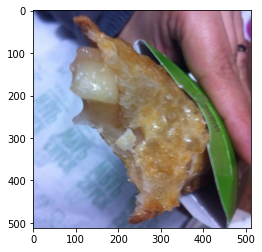

In [338]:
plt.imshow(plt.imread('101_food_classes_10_percent\\test\\apple_pie\\1011328.jpg'))

In [409]:
def see_whats_wrong(df):
    plt.figure(figsize=(12, 15))
    for i in range(9):
        plt.subplot(3, 3, i+1)
        random_index = np.random.choice(len(df))
        img = tf.io.read_file(df['img_path'].values[random_index])
        img = tf.image.decode_image(img)
        img = tf.image.resize(img, size=(224, 224))
        probs = df['pred_conf'].values[random_index]
        y_true = df['y_true_classname'].values[random_index]
        y_pred = df['y_pred_classname'].values[random_index]
        
        plt.imshow(img/255)
        plt.title(f'Actual: {y_true}\n Pred: {y_pred}\n Prob: {probs:.2f}%')
        plt.axis(False)

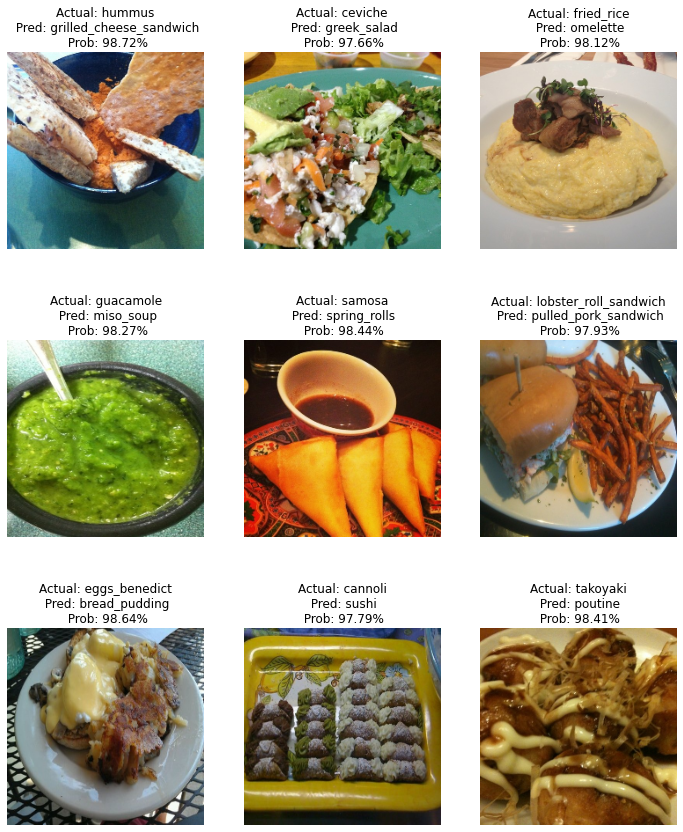

In [411]:
see_whats_wrong(top_100_wrong)

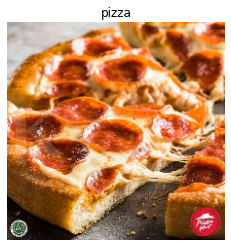

In [414]:
predict_classes_101('Preds/pizza_2.jpg', model_10)

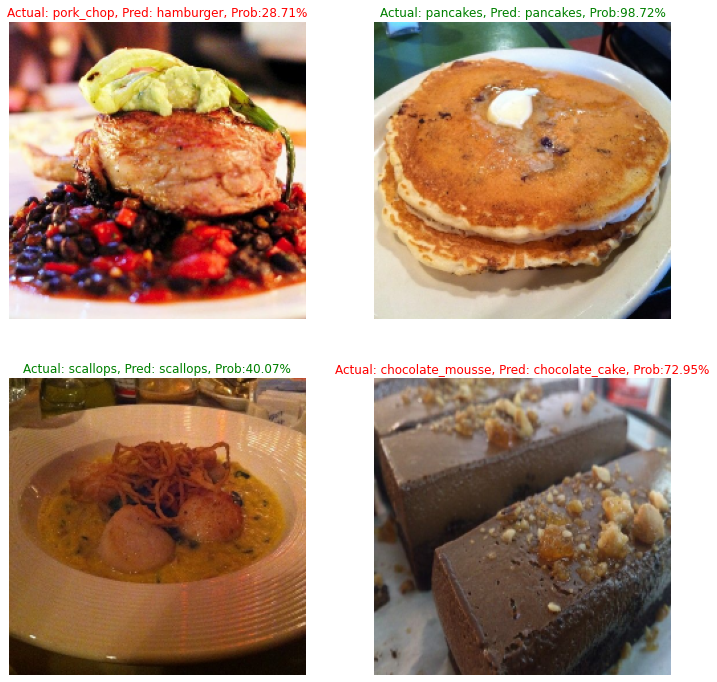

In [421]:
pick_test_image(model_10)

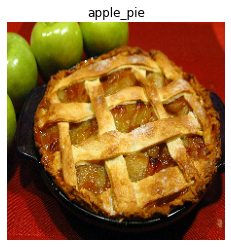

In [417]:
predict_classes_101('Preds/apple_pie.jpg', model_10)

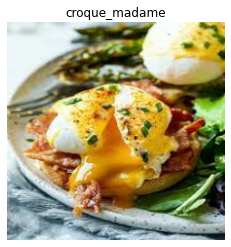

In [419]:
predict_classes_101('Preds/egg_benedict_1.jpg', model_10)

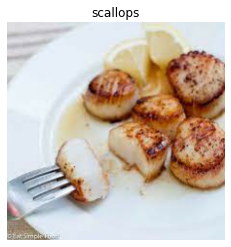

In [422]:
predict_classes_101('Preds/scallops_1.jpg', model_10)

# 5.16 Food Vision 101 100% train images

In [23]:
# Create train test dir
directory = 'food-101/food-101/images/'

# Split the directory into train data and test data
train_data_101 = tf.keras.preprocessing.image_dataset_from_directory(directory=directory,
                                                                     image_size=(224, 224),
                                                                     label_mode='categorical',
                                                                     validation_split=0.2,
                                                                     seed=42,
                                                                     subset='training')

test_data_101 = tf.keras.preprocessing.image_dataset_from_directory(directory=directory,
                                                                    image_size=(224, 224),
                                                                    label_mode='categorical',
                                                                    validation_split=0.2,
                                                                    subset='validation', 
                                                                    seed=42,
                                                                    shuffle=False)

Found 101000 files belonging to 101 classes.
Using 80800 files for training.
Found 101000 files belonging to 101 classes.
Using 20200 files for validation.


In [4]:
train_data_101, len(train_data_101), len(test_data_101)

(<BatchDataset shapes: ((None, 224, 224, 3), (None, 101)), types: (tf.float32, tf.float32)>,
 2525,
 632)

In [5]:
# Create a model, first set random seed
tf.random.set_seed(42)

# Create inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Create augmentation layer 
augmentation = Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomZoom(0.2),
    layers.RandomRotation(0.2)
], name='augmentation_layer')

# Pass the input image to augmentation layer will produce augmented image
x = augmentation(inputs)

# Pass augmented image to baseline (backbone) model
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False
x = base_model(x, training=False) # inference mode

# Set the feature extraction layer
x = layers.GlobalAveragePooling2D(name='feature_extraction_layer')(x)

# Set the outputs
outputs = layers.Dense(101, activation='softmax', name='output_layer')(x)

# Pass the inputs and outputs to model
model_101_1 = tf.keras.models.Model(inputs, outputs)

# Compile the model
model_101_1.compile(optimizer=Adam(),
                    loss=CategoricalCrossentropy(),
                    metrics='accuracy')

# Setup the callbacks
tensorboard = tf.keras.callbacks.TensorBoard('transfer_learning/101_100_percent/model_101_1')
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/101_100_percent/model_101_1/baseline.ckpt',
                                                monitor='val_accuracy',
                                                verbose=1,
                                                save_weights_only=True,
                                                save_best_only=True)

# Fit the model
history_101_1 = model_101_1.fit(train_data_101, 
                                epochs=5,
                                steps_per_epoch=len(train_data_101),
                                validation_data=test_data_101,
                                validation_steps=int(0.1 * len(test_data_101)),
                                callbacks=[tensorboard, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/5
2525/2525 [==============================] - 628s 244ms/step - loss: 2.1677 - accuracy: 0.4753 - val_loss: 1.4766 - val_accuracy: 0.5947

Epoch 00001: val_accuracy improved from -inf to 0.59474, saving model to transfer_learning/101_100_percent/model_101_1\baseline.ckpt
Epoch 2/5
2525/2525 [==============================] - 383s 151ms/step - loss: 1.6955 - accuracy: 0.5693 - val_loss: 1.2334 - val_accuracy: 0.6731

Epoch 00002: val_accuracy improved from 0.59474 to 0.67312, saving model to transfer_learning/101_100_percent/model_101_1\baseline.ckpt
Epoch 3/5
2525/2525 [==============================] - 333s 132ms/step - loss: 1.5783 - accuracy: 0.5954 - val_loss: 1.1744 - val_accuracy: 0.6840

Epoch 00003: val_accuracy improved from 0.67312 to 0.68403, saving model to transfer_learning/101_100_percent/model_101_1\baseline.ckpt
Epoch 4/5
2525/2525 [==============================] - 308s 122ms/step - loss: 1.5078 - accuracy: 0.6097 - val_loss: 1.2204 - val_accuracy: 0.6587

Epo

In [6]:
model_101_1.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
augmentation_layer (Sequenti (None, None, None, 3)     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
feature_extraction_layer (Gl (None, 1280)              0         
_________________________________________________________________
output_layer (Dense)         (None, 101)               129381    
Total params: 4,178,952
Trainable params: 129,381
Non-trainable params: 4,049,571
_________________________________________________________________


In [14]:
# Let's fine tune model
model_101_1.load_weights('transfer_learning/101_100_percent/model_101_1/baseline.ckpt')

# Let's unfrozen last 5 layers of efficient net
model_101_1.trainable = True
for layer in model_101_1.layers[2].layers[:-5]:
    layer.trainable = False

# Let's recompile our model
model_101_1.compile(optimizer=Adam(learning_rate=0.0001),
                    loss=CategoricalCrossentropy(),
                    metrics='accuracy')

# Setup the callbacks
tensorboard = tf.keras.callbacks.TensorBoard('transfer_learning/101_100_percent/model_101_1_tuned/')
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/101_100_percent/model_101_1_tuned/fine_tuned.ckpt',
                                                monitor='val_accuracy',
                                                verbose=1,
                                                save_weights_only=True,
                                                save_best_only=True)

# Let's refit our model
history_101_1_tuned_1 = model_101_1.fit(train_data_101, 
                                        epochs=10,
                                        initial_epoch=history_101_1.epoch[-1],
                                        steps_per_epoch=len(train_data_101),
                                        validation_data=test_data_101,
                                        validation_steps=int(0.1 * len(test_data_101)),
                                        callbacks=[tensorboard, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 5/10
2525/2525 [==============================] - 281s 109ms/step - loss: 1.4090 - accuracy: 0.6348 - val_loss: 1.2261 - val_accuracy: 0.6533

Epoch 00005: val_accuracy improved from -inf to 0.65327, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned.ckpt
Epoch 6/10
2525/2525 [==============================] - 273s 108ms/step - loss: 1.2936 - accuracy: 0.6604 - val_loss: 1.0719 - val_accuracy: 0.6964

Epoch 00006: val_accuracy improved from 0.65327 to 0.69643, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned.ckpt
Epoch 7/10
2525/2525 [==============================] - 296s 117ms/step - loss: 1.2240 - accuracy: 0.6770 - val_loss: 1.0760 - val_accuracy: 0.7009

Epoch 00007: val_accuracy improved from 0.69643 to 0.70089, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned.ckpt
Epoch 8/10
2525/2525 [==============================] - 293s 116ms/step - loss: 1.1717 - accuracy: 0.6912 - val_loss: 1.0547

In [17]:
# Let's fine tune model
model_101_1.load_weights('transfer_learning/101_100_percent/model_101_1_tuned/fine_tuned.ckpt')

# Let's unfrozen last 10 layers of efficient net
model_101_1.trainable = True
for layer in model_101_1.layers[2].layers[:-10]:
    layer.trainable = False

# Let's recompile our model
model_101_1.compile(optimizer=Adam(learning_rate=0.0001),
                    loss=CategoricalCrossentropy(),
                    metrics='accuracy')

# Setup the callbacks
tensorboard = tf.keras.callbacks.TensorBoard('transfer_learning/101_100_percent/model_101_1_tuned_2/')
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/101_100_percent/model_101_1_tuned/fine_tuned_2.ckpt',
                                                monitor='val_accuracy',
                                                verbose=1,
                                                save_weights_only=True,
                                                save_best_only=True)

# Let's refit our model
history_101_1_tuned_2 = model_101_1.fit(train_data_101, 
                                        epochs=15,
                                        initial_epoch=history_101_1_tuned_1.epoch[-1],
                                        steps_per_epoch=len(train_data_101),
                                        validation_data=test_data_101,
                                        validation_steps=int(0.1 * len(test_data_101)),
                                        callbacks=[tensorboard, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 10/15
2525/2525 [==============================] - 281s 109ms/step - loss: 1.0721 - accuracy: 0.7114 - val_loss: 0.9767 - val_accuracy: 0.7133

Epoch 00010: val_accuracy improved from -inf to 0.71329, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned_2.ckpt
Epoch 11/15
2525/2525 [==============================] - 281s 111ms/step - loss: 1.0274 - accuracy: 0.7217 - val_loss: 0.9788 - val_accuracy: 0.7188

Epoch 00011: val_accuracy improved from 0.71329 to 0.71875, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned_2.ckpt
Epoch 12/15
2525/2525 [==============================] - 283s 112ms/step - loss: 0.9837 - accuracy: 0.7313 - val_loss: 0.9513 - val_accuracy: 0.7212

Epoch 00012: val_accuracy improved from 0.71875 to 0.72123, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned_2.ckpt
Epoch 13/15
2525/2525 [==============================] - 281s 111ms/step - loss: 0.9511 - accuracy: 0.7392 - val_lo

In [19]:
# Let's fine tune model
model_101_1.load_weights('transfer_learning/101_100_percent/model_101_1_tuned/fine_tuned_2.ckpt')

# Let's unfrozen last 15 layers of efficient net
model_101_1.trainable = True
for layer in model_101_1.layers[2].layers[:-15]:
    layer.trainable = False

# Let's recompile our model
model_101_1.compile(optimizer=Adam(learning_rate=0.0001),
                    loss=CategoricalCrossentropy(),
                    metrics='accuracy')

# Setup the callbacks
tensorboard = tf.keras.callbacks.TensorBoard('transfer_learning/101_100_percent/model_101_1_tuned_3/')
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/101_100_percent/model_101_1_tuned/fine_tuned_3.ckpt',
                                                monitor='val_accuracy',
                                                verbose=1,
                                                save_weights_only=True,
                                                save_best_only=True)

# Let's refit our model
history_101_1_tuned_3 = model_101_1.fit(train_data_101, 
                                        epochs=20,
                                        initial_epoch=history_101_1_tuned_2.epoch[-1],
                                        steps_per_epoch=len(train_data_101),
                                        validation_data=test_data_101,
                                        validation_steps=int(0.1 * len(test_data_101)),
                                        callbacks=[tensorboard, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 15/20
2525/2525 [==============================] - 291s 113ms/step - loss: 0.8616 - accuracy: 0.7589 - val_loss: 0.8350 - val_accuracy: 0.7564

Epoch 00015: val_accuracy improved from -inf to 0.75645, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned_3.ckpt
Epoch 16/20
2525/2525 [==============================] - 283s 112ms/step - loss: 0.8295 - accuracy: 0.7679 - val_loss: 0.9130 - val_accuracy: 0.7282

Epoch 00016: val_accuracy did not improve from 0.75645
Epoch 17/20
2525/2525 [==============================] - 285s 113ms/step - loss: 0.7964 - accuracy: 0.7755 - val_loss: 0.7876 - val_accuracy: 0.7674

Epoch 00017: val_accuracy improved from 0.75645 to 0.76736, saving model to transfer_learning/101_100_percent/model_101_1_tuned\fine_tuned_3.ckpt
Epoch 18/20
2525/2525 [==============================] - 287s 113ms/step - loss: 0.7699 - accuracy: 0.7821 - val_loss: 0.8132 - val_accuracy: 0.7555

Epoch 00018: val_accuracy did not improve from 0.76736
E

In [20]:
model_101_1.save('transfer_learning/101_100_percent/')

INFO:tensorflow:Assets written to: transfer_learning/101_100_percent/assets


C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


In [21]:
model_101_1.evaluate(test_data_101)

632/632 [==============================] - 63s 99ms/step - loss: 0.8073 - accuracy: 0.7710


[0.8072758316993713, 0.7709900736808777]

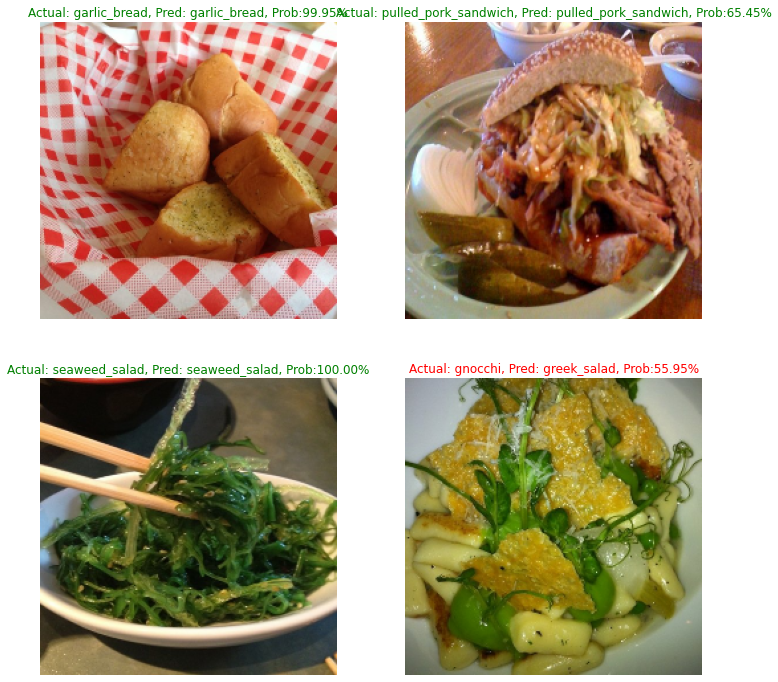

In [31]:
pick_test_image(model_101_1)

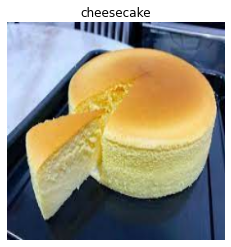

In [48]:
predict_classes_101('Preds/cheese_cake_1.jpg', model_101_1)

## 5.17 Milestone Food Vision 101

In [49]:
from tensorflow.python.client.device_lib import list_local_devices
list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 4070306531476209162,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 2254123828
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 10464813922759798494
 physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1650 Ti, pci bus id: 0000:01:00.0, compute capability: 7.5"]

In [51]:
history_101_1_df = pd.DataFrame(history_101_1.history)
history_101_1_tuned_1_df = pd.DataFrame(history_101_1_tuned_1.history)
history_101_1_tuned_2_df = pd.DataFrame(history_101_1_tuned_2.history)
history_101_1_tuned_3_df = pd.DataFrame(history_101_1_tuned_3.history)

In [59]:
t1 = history_101_1_tuned_1_df.val_loss.values
t1

array([1.22614515, 1.07188022, 1.07602358, 1.05467749, 1.010203  ,
       1.03267443])

In [63]:
t2 = history_101_1_tuned_2_df.val_loss.values
t3 = history_101_1_tuned_3_df.val_loss.values

In [60]:
o1 = history_101_1_df.val_loss.values
o1

array([1.47658455, 1.23342097, 1.1744076 , 1.22035003, 1.15205634])

In [61]:
t1 = np.append(t1, o1)
t1

array([1.22614515, 1.07188022, 1.07602358, 1.05467749, 1.010203  ,
       1.03267443, 1.47658455, 1.23342097, 1.1744076 , 1.22035003,
       1.15205634])

In [64]:
t1 = np.append(t1, [t2, t3])

In [66]:
val_loss_combined = t1

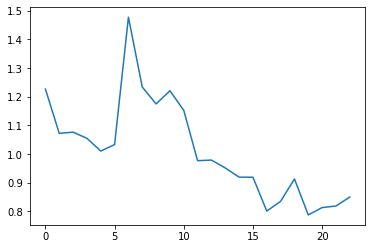

In [69]:
plt.plot(val_loss_combined);

In [2]:
import tensorflow_datasets as tfds

In [3]:
'food101' in tfds.list_builders()

True

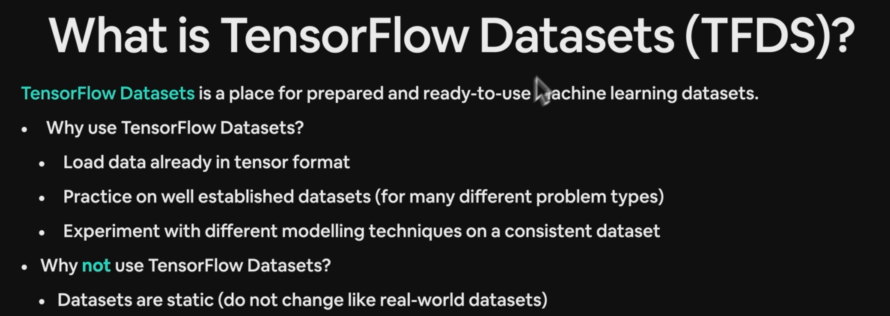

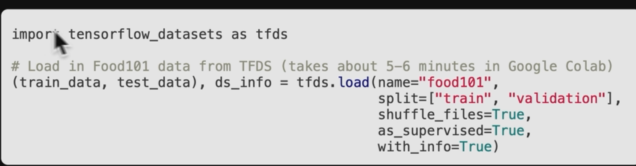

In [3]:
# load the data
(train_data, test_data), ds_info = tfds.load(name='food101',
                                             split=['train', 'validation'],
                                             as_supervised=True, # Data gets returned in tuples (data, label)
                                             shuffle_files=True,
                                             batch_size=32,
                                             with_info=True) 

In [4]:
len(train_data), len(test_data), train_data

(2368,
 790,
 <_OptionsDataset shapes: ((None, None, None, 3), (None,)), types: (tf.uint8, tf.int64)>)

In [5]:
ds_info

tfds.core.DatasetInfo(
    name='food101',
    full_name='food101/2.0.0',
    description="""
    This dataset consists of 101 food categories, with 101'000 images. For each class, 250 manually reviewed test images are provided as well as 750 training images. On purpose, the training images were not cleaned, and thus still contain some amount of noise. This comes mostly in the form of intense colors and sometimes wrong labels. All images were rescaled to have a maximum side length of 512 pixels.
    """,
    homepage='https://www.vision.ee.ethz.ch/datasets_extra/food-101/',
    data_path='C:\\Users\\Acer\\tensorflow_datasets\\food101\\2.0.0',
    download_size=4.65 GiB,
    dataset_size=4.77 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=101),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=

In [6]:
train_data

<_OptionsDataset shapes: ((None, None, None, 3), (None,)), types: (tf.uint8, tf.int64)>

In [7]:
class_names = ds_info.features['label'].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [8]:
for img, label in train_data.take(1):
    print(img, label)

tf.Tensor(
[[[[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]

  ...

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [  0   0   0]
   [  0   0   0]
   [  0   0   0]]]


 [[[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [144  81 102]
   [142  78 102]
   [139  75  99]]

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [159  96 115]
   [154  89 111]
   [146  83 104]]

  [[  0   0   0]
   [  0   0   0]
   [  0   0   0]
   ...
   [162  98 114]
   [162  95 113]


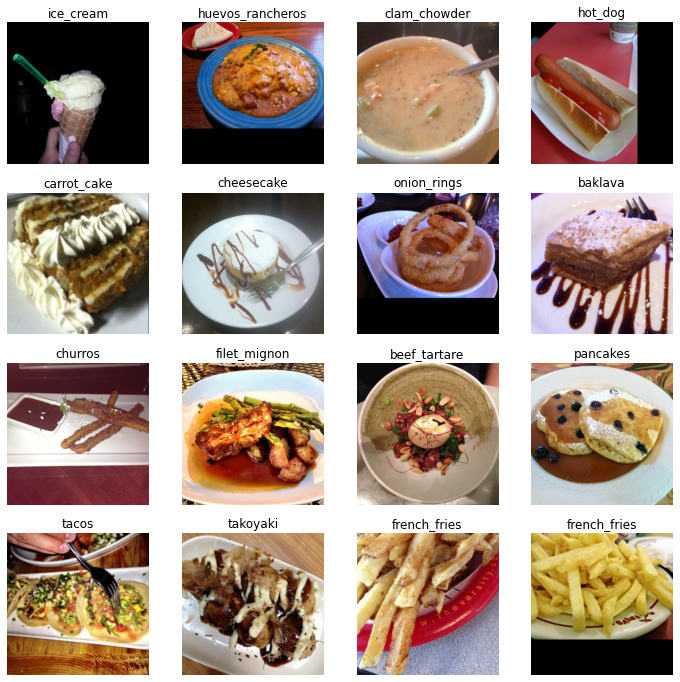

In [9]:
plt.figure(figsize=(12, 12))
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(img[i])
    plt.title(class_names[label[i]])
    plt.axis('off');

In [25]:
import helper_functions as helper

In [26]:
tf.math.reduce_min(img), tf.math.reduce_max(img)

(<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
 <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

In [10]:
# Preprocess image 
def preprocess_image(image, label):
    """
    Convert image datatype from 'uint8' -> 'float32' and 
    reshapes image to (224, 224, 3)
    """
    image = tf.image.resize(image, size=(224, 224)) # Reshape target image
    return tf.cast(image, tf.float32), label # Return (float32_image, label) tuple

In [11]:
img_after, labels = preprocess_image(img, label)

In [12]:
img_after.shape, img.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32, 512, 512, 3]))

In [13]:
img_after

<tf.Tensor: shape=(32, 224, 224, 3), dtype=float32, numpy=
array([[[[  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         ...,
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ]],

        [[  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         ...,
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ]],

        [[  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         ...,
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.     

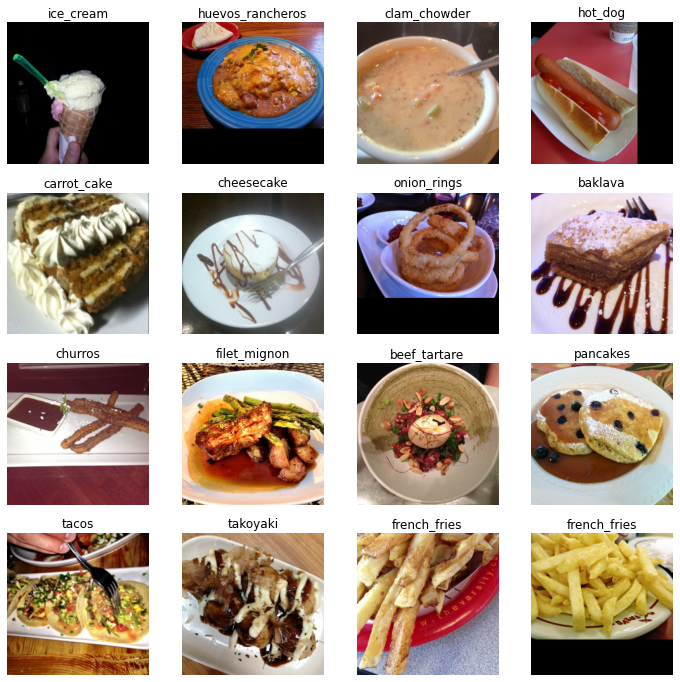

In [14]:
plt.figure(figsize=(12, 12))
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(img_after[i]/255)
    plt.title(class_names[labels[i]])
    plt.axis('off');

In [15]:
# map preprocess train data and parallelize
train_data = train_data.map(map_func=preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
# Prefetch train data (load it faster)
train_data = train_data.prefetch(buffer_size=tf.data.AUTOTUNE)

# Map preprocess test data
test_data = test_data.map(map_func=preprocess_image, num_parallel_calls=tf.data.AUTOTUNE).prefetch(buffer_size=tf.data.AUTOTUNE)

In [16]:
train_data

<PrefetchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.int64)>

In [17]:
test_data

<PrefetchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.int64)>

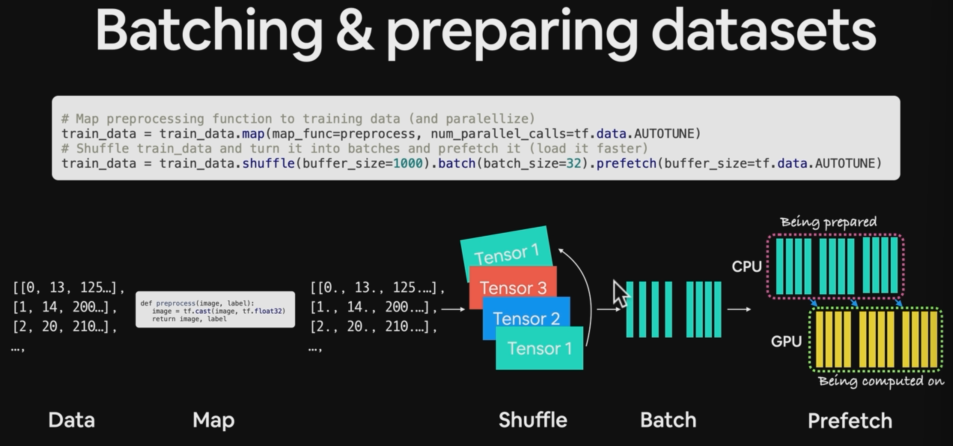

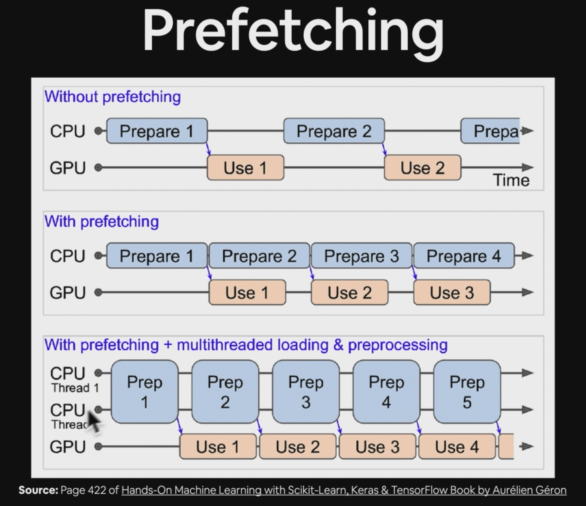

## 5.18 Create modelling callbacks

In [18]:
tensorboard = tf.keras.callbacks.TensorBoard('transfer_learning/101_100_percent/model_2')

checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/101_100_percent/model_2/model_2.ckpt',
                                                verbose=1,
                                                monitor='val_accuracy',
                                                save_best_only=True,
                                                save_weights_only=True)

early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                              verbose=1,
                                              patience=3)

## 5.19 Mixed precision training
>**Utilizes float32 and float16 data types to speed up model performance**

In [19]:
# Turn on mized precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16') # set global data policy to mixed float16

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce GTX 1650 Ti, compute capability 7.5


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce GTX 1650 Ti, compute capability 7.5


In [20]:
mixed_precision.global_policy()

<Policy "mixed_float16">

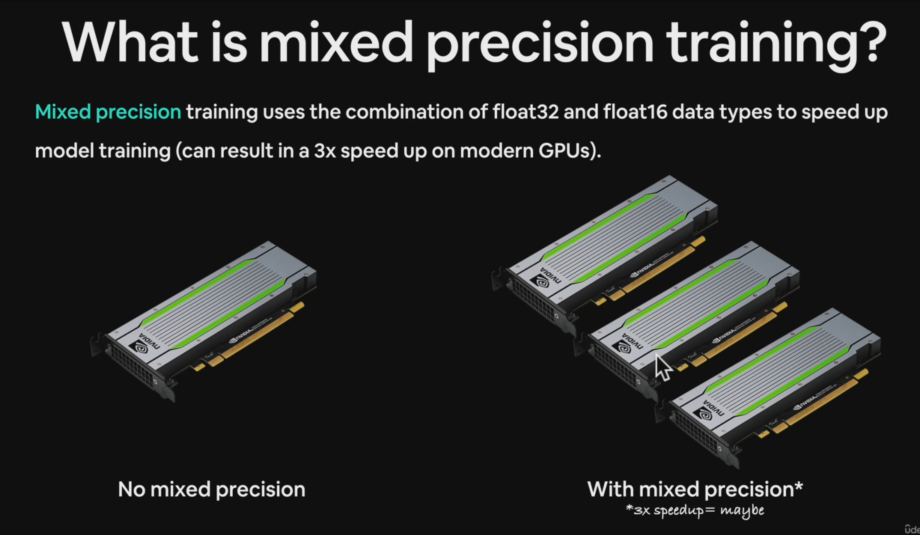

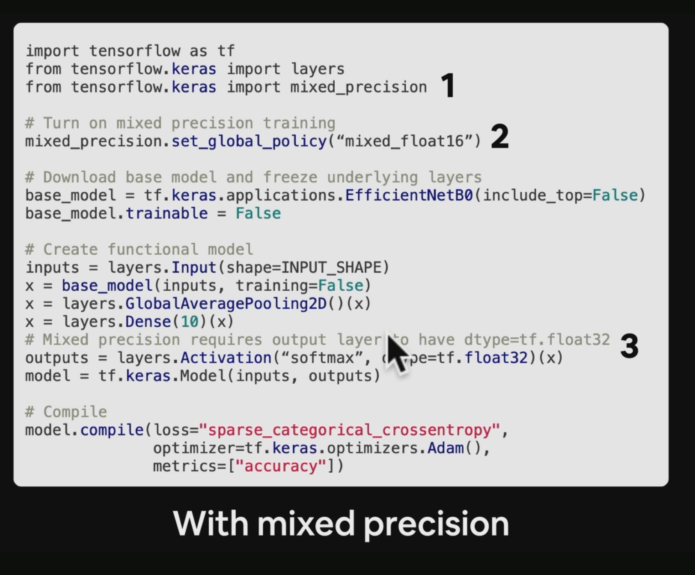

>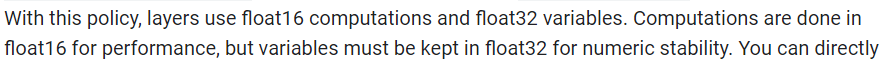

In [29]:
# Create train test dir
directory = 'food-101/food-101/images/'

# Split the directory into train data and test data
train_data_101 = tf.keras.preprocessing.image_dataset_from_directory(directory=directory,
                                                                     image_size=(224, 224),
                                                                     label_mode='categorical',
                                                                     validation_split=0.2,
                                                                     seed=42,
                                                                     subset='training')

test_data_101 = tf.keras.preprocessing.image_dataset_from_directory(directory=directory,
                                                                    image_size=(224, 224),
                                                                    label_mode='categorical',
                                                                    validation_split=0.2,
                                                                    subset='validation', 
                                                                    seed=42,
                                                                    shuffle=False)

Found 101000 files belonging to 101 classes.
Using 80800 files for training.
Found 101000 files belonging to 101 classes.
Using 20200 files for validation.


In [30]:
# Build our model, first set mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

# Prefetching
train_data_101 = train_data_101.prefetch(buffer_size=tf.data.AUTOTUNE)
test_data_101 = test_data_101.prefetch(buffer_size=tf.data.AUTOTUNE)

# Set a random seed
tf.random.set_seed(42)

# Create inputs
inputs = layers.Input(shape=(224, 224, 3), name='input_layer')

# Pass the input image to augmentation layer
augmented = Sequential([
    layers.RandomFlip('horizontal'), 
    layers.RandomHeight(0.2),
    layers.RandomWidth(0.2),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2)
], name='augmentation_layer')
x = augmented(inputs)

# Pass the augmented image to base model (back bone)
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = False
x = base_model(x, training=False) # Set into inference mode (make sure the weights aren't updated)

# Set feature extraction layer
x = layers.GlobalAveragePooling2D(name='extraction_layer')(x)

# Set the outputs, make sure using dtype=float32 for numeric stability after using float16 for computation process
x = layers.Dense(101, name='output_layer')(x)
outputs = layers.Activation('softmax', dtype='float32')(x)

# Passing the output and input to model
model_2 = tf.keras.Model(inputs, outputs)

# Compile the model
model_2.compile(loss=CategoricalCrossentropy(),
                optimizer=Adam(), 
                metrics='accuracy')

# Set the callbacks
tensorboard = tf.keras.callbacks.TensorBoard('transfer_learning/101_100_percent/model_2')

checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='transfer_learning/101_100_percent/model_2/model_2.ckpt',
                                                verbose=1,
                                                monitor='val_accuracy',
                                                save_best_only=True,
                                                save_weights_only=True)

# Fit the model
history_2 = model_2.fit(train_data_101,
                        epochs=5,
                        steps_per_epoch=len(train_data_101),
                        validation_data=test_data_101,
                        validation_steps=int(0.1*len(test_data_101)),
                        callbacks=[tensorboard, checkpoint])

C:\Users\Acer\anaconda3\envs\my_env\lib\site-packages\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/5
  53/2525 [..............................] - ETA: 6:19 - loss: nan - accuracy: 0.0454

KeyboardInterrupt: 

In [ ]:
test